# 250413: CDKL5 Stability Computation
Computing stability changes due to point mutation in CDKL5

# 02 SAAFEC-SEQ

## 2.1 preview CDKL5 mutation data

In [14]:
import pandas as pd

# Define the file path
file_path = '/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/00_data/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq.xlsx'

# Load the first sheet of the Excel file
df = pd.read_excel(file_path, sheet_name=0)

# Display the entire DataFrame
print(df.to_string())  # Converts the entire DataFrame to a string for full display

                                              Name Gene(s) Protein change mutation wild  position mutant                                                                                                                                                                                                           Condition(s)     Accession GRCh37Chromosome  GRCh37Location GRCh38Chromosome  GRCh38Location  VariationID  AlleleID(s)      dbSNP ID             Canonical SPDI               Variant type Molecular consequence                       Germline classification         Source Germline date last evaluated                                Germline review status  ddG_saafecseq_seq  ddg_imutant2_seq  ddg_imutant2_str
0                      ENSP00000369325.3:p.Ile3Phe   CDKL5            I3F      I3F    I         3      F                                                                                                                                                                                     

## 1.2 Prepare mutation list for SAAFEC-SEQ

In [ ]:
# === Part 1: Prepare mutation list ===

import pandas as pd

# --- Configuration ---
excel_file = '/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/00_data/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq.xlsx'
sheet_name = 0
mutation_txt = '/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/02_stability/01_saafecseq/mutation_list.txt'

# --- Step 1: Load Excel ---
df = pd.read_excel(excel_file, sheet_name=sheet_name)

# --- Step 2: Create Mutation List File ---
mutation_entries = []
mutation_keys = []

for idx, row in df.iterrows():
    wild = str(row['wild']).strip().upper()
    pos = str(row['position']).strip()
    mutant = str(row['mutant']).strip().upper()

    if wild != 'nan' and pos != 'nan' and mutant != 'nan':
        mutation_entries.append(f"{wild} {pos} {mutant}")
        mutation_keys.append(f"{wild}_{pos}_{mutant}")

# Save to mutation_list.txt
with open(mutation_txt, 'w') as f:
    f.write("\n".join(mutation_entries))

print(f"✅ Saved {len(mutation_entries)} mutations to {mutation_txt}")

✅ Saved 156 mutations to /mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/02_stability/01_saafecseq/mutation_list.txt


## 1.3 Run SAAFEC-SEQ on Palmetto

In [16]:
# run saafec-seq on palmetto
# python saafec-seq.py -i 01_cdkl5_1_960.fasta -f mutation_list.txt -o saafec_result.out -v


# ======================================
#!/bin/bash
#SBATCH --job-name=saafecseq_cdkl5_run
#SBATCH --nodes=1
#SBATCH --ntasks=1
#SBATCH --cpus-per-task=40
#SBATCH --mem=128G
#SBATCH --time=24:00:00
#SBATCH --output=saafecseq_%j.log

# Load conda environment
source activate /project/ealexov/compbio/software/py37_webservers

# Navigate to working directory
cd /project/ealexov/compbio/shamrat/250404_saafecseq

# Run SAAFEC-SEQ
python saafec-seq.py -i O76039.fasta -f mutation_list.txt -o saafec_result.out -v

# ===============================================

SyntaxError: invalid decimal literal (486254104.py, line 19)

## 1.4 Update the Excel file with prediction results

In [ ]:
# === Part 3: Update Excel with ddG and Type ===

import pandas as pd

# --- Configuration ---
result_file = '/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/02_stability/01_saafecseq/saafec_result.out'                             # Output from SAAFEC-SEQ
original_excel = '/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/00_data/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq.xlsx' # Original Excel
updated_excel = '/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/02_stability/01_saafecseq/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq_saafecseq.xlsx'          # Final updated file

# --- Step 1: Load Prediction Results ---
try:
    result_df = pd.read_csv(result_file, delim_whitespace=True)
except Exception as e:
    print("❌ Failed to read result output:", e)
    exit(1)

# Create mutation_key to match Excel
result_df['mutation_key'] = result_df['Wild'].astype(str).str.upper() + "_" + result_df['Position'].astype(str) + "_" + result_df['Mutant'].astype(str).str.upper()

# --- Step 2: Load Original Excel ---
df = pd.read_excel(original_excel, sheet_name=0)
df['mutation_key'] = df['wild'].astype(str).str.upper() + "_" + df['position'].astype(str) + "_" + df['mutant'].astype(str).str.upper()

# --- Step 3: Merge Data ---
df = df.merge(result_df[['mutation_key', 'ddG', 'Type']], on='mutation_key', how='left')
df.drop(columns=['mutation_key'], inplace=True)

# --- Step 4: Save Updated Excel ---
df.to_excel(updated_excel, index=False)
print(f"📄 Excel updated with SAAFEC-SEQ results: {updated_excel}")


📄 Excel updated with SAAFEC-SEQ results: /mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/02_stability/01_saafecseq/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq_saafecseq.xlsx


# 02 I-MUTANT: Seq & Str [run on colab]
visit: https://colab.research.google.com/drive/1WUJUODGAbV2Ho2OK3jzkzkRGZ8JFEBb_?authuser=1#scrollTo=dfFTwIhkOR9f

In [ ]:
# visit: https://colab.research.google.com/drive/1WUJUODGAbV2Ho2OK3jzkzkRGZ8JFEBb_?authuser=1#scrollTo=dfFTwIhkOR9f

# 03 INPS SEQ
https://inpsmd.biocomp.unibo.it/

## 3.1 LOAD DATA

In [ ]:
import pandas as pd

# Define the file path
file_path = '/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/00_data/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq.xlsx'

# Load the first sheet of the Excel file
df = pd.read_excel(file_path, sheet_name=0)

# Display the entire DataFrame
print(df.to_string())  # Converts the entire DataFrame to a string for full display

                                              Name Gene(s) Protein change mutation wild  position mutant                                                                                                                                                                                                           Condition(s)     Accession GRCh37Chromosome  GRCh37Location GRCh38Chromosome  GRCh38Location  VariationID  AlleleID(s)      dbSNP ID             Canonical SPDI               Variant type Molecular consequence                       Germline classification         Source Germline date last evaluated                                Germline review status  ddG_saafecseq_seq  ddg_imutant2_seq  ddg_imutant2_str
0                      ENSP00000369325.3:p.Ile3Phe   CDKL5            I3F      I3F    I         3      F                                                                                                                                                                                     

## 3.2 extract mutation column only

In [ ]:
import pandas as pd

# Load the Excel file
excel_file = '/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/00_data/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq_af.xlsx'
df = pd.read_excel(excel_file)

# Extract the 'mutation' column
mutations = df['mutation'].dropna().astype(str)  # Remove any NaN values, ensure string format

# Save to a text file (one mutation per line)
output_file = '/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/02_stability/03_inps/cdkl5_mutations_only.txt'
mutations.to_csv(output_file, index=False, header=False)

print(f"✅ Mutation list saved to: {output_file}")


✅ Mutation list saved to: /mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/02_stability/03_inps/cdkl5_mutations_only.txt


## 3.3 Submit '*.txt' mutations as file to  inps seq website


## 3.4 load json file

In [ ]:
import json

# Load the JSON file
with open('/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250404_stability_compute/250409_2_inps_seq/result_inpsseq_1_773.json', 'r') as f:
    data = json.load(f)

# Pretty-print the entire JSON structure
import pprint
pprint.pprint(data)


{'accession': 'sp|O76039|CDKL5_HUMAN',
 'sequence': {'len': 960,
              'sequence': 'MKIPNIGNVMNKFEILGVVGEGAYGVVLKCRHKETHEIVAIKKFKDSEENEEVKETTLRELKMLRTLKQENIVELKEAFRRRGKLYLVFEYVEKNMLELLEEMPNGVPPEKVKSYIYQLIKAIHWCHKNDIVHRDIKPENLLISHNDVLKLCDFGFARNLSEGNNANYTEYVATRWYRSPELLLGAPYGKSVDMWSVGCILGELSDGQPLFPGESEIDQLFTIQKVLGPLPSEQMKLFYSNPRFHGLRFPAVNHPQSLERRYLGILNSVLLDLMKNLLKLDPADRYLTEQCLNHPTFQTQRLLDRSPSRSAKRKPYHVESSTLSNRNQAGKSTALQSHHRSNSKDIQNLSVGLPRADEGLPANESFLNGNLAGASLSPLHTKTYQASSQPGSTSKDLTNNNIPHLLSPKEAKSKTEFDFNIDPKPSEGPGTKYLKSNSRSQQNRHSFMESSQSKAGTLQPNEKQSRHSYIDTIPQSSRSPSYRTKAKSHGALSDSKSVSNLSEARAQIAEPSTSRYFPSSCLDLNSPTSPTPTRHSDTRTLLSPSGRNNRNEGTLDSRRTTTRHSKTMEELKLPEHMDSSHSHSLSAPHESFSYGLGYTSPFSSQQRPHRHSMYVTRDKVRAKGLDGSLSIGQGMAARANSLQLLSPQPGEQLPPEMTVARSSVKETSREGTSSFHTRQKSEGGVYHDPHSDDGTAPKENRHLYNDPVPRRVGSFYRVPSPRPDNSFHENNVSTRVSSLPSESSSGTNHSKRQPAFDPWKSPENISHSEQLKEKEKQGFFRSMKKKKKKSQTVPNSDSPDLLTLQKSIHSASTPSSRPKEWRPEKISDLQTQSQPLKSLRKLLHLSSASNHPASSDPRFQPLTAQQTKNSFSEIRIHPLSQASGGSSNIRQEPAPKGRPALQLPGQMD

## 3.4 Add inps seq result into excel

### 3.4.1 : 1-227

In [ ]:
import pandas as pd
import json

# Load your Excel file
df = pd.read_excel('/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/00_data/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq_af.xlsx')

# Load the INPS-MD result JSON
with open('/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/02_stability/03_inps_seq/inps_seq_1_227.json', 'r') as f:
    json_data = json.load(f)

# Extract mutation records from JSON
variants = json_data['variants']
ddg_records = [{
    'wild': var['wild_type'],
    'position': var['position'],
    'mutant': var['variant'],
    'INPS_DDG': var['ddg']
} for var in variants]

ddg_df = pd.DataFrame(ddg_records)

# Merge without modifying the original columns
merged_df = pd.merge(
    df.copy(),         # do not modify the original DataFrame
    ddg_df, 
    how='left',
    on=['wild', 'position', 'mutant']
)

# Save the updated file
merged_df.to_excel('/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/02_stability/03_inps_seq/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq_af_inps_seq_1_227.xlsx', index=False)

print("✅ Done! Added 'INPS_DDG' to the Excel file.")


✅ Done! Added 'INPS_DDG' to the Excel file.


### 3.4.2: 240 -895

In [ ]:
import pandas as pd
import json

# Load your Excel file
df = pd.read_excel('/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/02_stability/03_inps_seq/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq_af_inps_seq_1_227.xlsx')

# Load the INPS-MD result JSON
with open('/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/02_stability/03_inps_seq/inps_seq_240_895.json', 'r') as f:
    json_data = json.load(f)

# Extract mutation records from JSON
variants = json_data['variants']
ddg_records = [{
    'wild': var['wild_type'],
    'position': var['position'],
    'mutant': var['variant'],
    'INPS_DDG': var['ddg']
} for var in variants]

ddg_df = pd.DataFrame(ddg_records)

# Merge without modifying the original columns
merged_df = pd.merge(
    df.copy(),         # do not modify the original DataFrame
    ddg_df, 
    how='left',
    on=['wild', 'position', 'mutant'
    ]
)

# Save the updated file
merged_df.to_excel('/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/02_stability/03_inps_seq/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq_af_inps_seq_1_227_240_895.xlsx', index=False)

print("✅ Done! Added 'INPS_DDG' to the Excel file.")


✅ Done! Added 'INPS_DDG' to the Excel file.


## 3.5 add inps str result into excel (1-227)

In [ ]:

import pandas as pd
import json

# Load your Excel file
df = pd.read_excel('/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/00_data/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq_af.xlsx')

# Load the INPS-MD result JSON
with open('/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/02_stability/04_inps_str/inps_str_1_227.json', 'r') as f:
    json_data = json.load(f)

# Extract mutation records from JSON
variants = json_data['variants']
ddg_records = [{
    'wild': var['wild_type'],
    'position': var['position'],
    'mutant': var['variant'],
    'INPS_DDG': var['ddg']
} for var in variants]

ddg_df = pd.DataFrame(ddg_records)

# Merge without modifying the original columns
merged_df = pd.merge(
    df.copy(),         # do not modify the original DataFrame
    ddg_df, 
    how='left',
    on=['wild', 'position', 'mutant'
    ]
)

# Save the updated file
merged_df.to_excel('/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/02_stability/04_inps_str/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq_af_inps_str_1_227.xlsx', index=False)

print("✅ Done! Added 'INPS_DDG' to the Excel file.")



✅ Done! Added 'INPS_DDG' to the Excel file.


## 3.5.1 add inps str result into excel (240-302)

In [ ]:

import pandas as pd
import json

# Load your Excel file
df = pd.read_excel('/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/02_stability/04_inps_str/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq_af_inps_str_1_227.xlsx')

# Load the INPS-MD result JSON
with open('/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/02_stability/04_inps_str/inps_str_240_302.json', 'r') as f:
    json_data = json.load(f)

# Extract mutation records from JSON
variants = json_data['variants']
ddg_records = [{
    'wild': var['wild_type'],
    'position': var['position'],
    'mutant': var['variant'],
    'INPS_DDG': var['ddg']
} for var in variants]

ddg_df = pd.DataFrame(ddg_records)

# Merge without modifying the original columns
merged_df = pd.merge(
    df.copy(),         # do not modify the original DataFrame
    ddg_df, 
    how='left',
    on=['wild', 'position', 'mutant'
    ]
)

# Save the updated file
merged_df.to_excel('/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/02_stability/04_inps_str/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq_af_inps_str_240_302.xlsx', index=False)

print("✅ Done! Added 'INPS_DDG' to the Excel file.")



✅ Done! Added 'INPS_DDG' to the Excel file.


# 04 DDGEMB seq

## 4.1. make seq list for ddgemb

In [ ]:
import pandas as pd

# Define the file path
file_path = '/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/00_data/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq_af.xlsx'

# Load the first sheet of the Excel file
df = pd.read_excel(file_path, sheet_name=0)

# Display the entire DataFrame
print(df.to_string())  # Converts the entire DataFrame to a string for full display

                                              Name Gene(s) Protein change mutation wild  position mutant  Allele Frequency                                                                                                                                                                                                           Condition(s)     Accession GRCh37Chromosome  GRCh37Location GRCh38Chromosome  GRCh38Location  VariationID  AlleleID(s)      dbSNP ID             Canonical SPDI               Variant type Molecular consequence                       Germline classification         Source Germline date last evaluated                                Germline review status  ddG_saafecseq_seq  ddg_imutant2_seq  ddg_inps_seq  ddg_ddgun_seq  ddg_imutant2_str  ddg_inps_str  ddg_ddgun_str
0                      ENSP00000369325.3:p.Ile3Phe   CDKL5            I3F      I3F    I         3      F      9.211558e-06                                                                                       

## 4.2 extract mutation column

In [ ]:
import pandas as pd

# Load the Excel file
excel_file = '/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/00_data/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq_af.xlsx'
df = pd.read_excel(excel_file)

# Extract the 'mutation' column
mutations = df['mutation'].dropna().astype(str)  # Remove any NaN values, ensure string format

# Save to a text file (one mutation per line)
output_file = '/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/02_stability/06_ddgemb_seq/cdkl5_mutations_only_ddgemb.txt'
mutations.to_csv(output_file, index=False, header=False)

print(f"✅ Mutation list saved to: {output_file}")


✅ Mutation list saved to: /mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/02_stability/06_ddgemb_seq/cdkl5_mutations_only_ddgemb.txt


## 4.3 view json file

In [ ]:
import json

# Load the JSON file
with open('result_ddgemb_str.json', 'r') as f:
    data = json.load(f)

# Pretty-print the entire JSON structure
import pprint
pprint.pprint(data)


## 4.4 add ddgmb result into excel 1-227

In [ ]:
import pandas as pd
import json

# Load your Excel file
df = pd.read_excel('/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/00_data/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq_af.xlsx')

# Load the DDGEmb result JSON
with open('/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/02_stability/06_ddgemb_seq/ddgemb_seq_1_227.json', 'r') as f:
    json_data = json.load(f)

# Extract mutation records from the correct key
variants = json_data['single_variants']
ddg_records = [{
    'wild': var['wild_type'],
    'position': var['position'],
    'mutant': var['variant'],
    'DDGEmb_DDG': var['ddg']
} for var in variants]

ddg_df = pd.DataFrame(ddg_records)

# Merge without modifying the original DataFrame
merged_df = pd.merge(
    df.copy(),
    ddg_df,
    how='left',
    on=['wild', 'position', 'mutant']
)

# Save the merged output
merged_df.to_excel('/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/02_stability/06_ddgemb_seq/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq_af_ddgemb_seq_1_227.xlsx', index=False)

print("✅ Done! Added 'DDGEmb_DDG' to the Excel file.")


✅ Done! Added 'DDGEmb_DDG' to the Excel file.


## 4.5 add results ddgemb seq 240-895

In [ ]:
import pandas as pd
import json

# Load your Excel file
df = pd.read_excel('/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/02_stability/06_ddgemb_seq/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq_af_ddgemb_seq_1_227.xlsx')

# Load the DDGEmb result JSON
with open('/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/02_stability/06_ddgemb_seq/ddgemb_seq_240_895.json', 'r') as f:
    json_data = json.load(f)

# Extract mutation records from the correct key
variants = json_data['single_variants']
ddg_records = [{
    'wild': var['wild_type'],
    'position': var['position'],
    'mutant': var['variant'],
    'DDGEmb_DDG': var['ddg']
} for var in variants]

ddg_df = pd.DataFrame(ddg_records)

# Merge without modifying the original DataFrame
merged_df = pd.merge(
    df.copy(),
    ddg_df,
    how='left',
    on=['wild', 'position', 'mutant']
)

# Save the merged output
merged_df.to_excel('/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/02_stability/06_ddgemb_seq/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq_af_ddgemb_seq_1_227_240_895.xlsx', index=False)

print("✅ Done! Added 'DDGEmb_DDG' to the Excel file.")


✅ Done! Added 'DDGEmb_DDG' to the Excel file.


# 05 DDGUN
[site is not accessible 4/21/2025] <br>
[http://folding.biofold.org/ddgun]

## 5.1 load data

In [ ]:
import pandas as pd

# Define the file path
file_path = '/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/00_data/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq_af.xlsx'

# Load the first sheet of the Excel file
df = pd.read_excel(file_path, sheet_name=0)

# Display the entire DataFrame
print(df.to_string())  # Converts the entire DataFrame to a string for full display

                                              Name Gene(s) Protein change mutation wild  position mutant  Allele Frequency                                                                                                                                                                                                           Condition(s)     Accession GRCh37Chromosome  GRCh37Location GRCh38Chromosome  GRCh38Location  VariationID  AlleleID(s)      dbSNP ID             Canonical SPDI               Variant type Molecular consequence                       Germline classification         Source Germline date last evaluated                                Germline review status  ddG_saafecseq_seq  ddg_imutant2_seq  ddg_inps_seq  ddg_imutant2_str  ddg_inps_str
0                      ENSP00000369325.3:p.Ile3Phe   CDKL5            I3F      I3F    I         3      F      9.211558e-06                                                                                                                     

## 5.2 ddgun seq
https://folding.biofold.org/ddgun/

In [ ]:
import pandas as pd

# Load original Excel file
df_orig = pd.read_excel("/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/00_data/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq_af.xlsx")

# Load DDGun output
ddgun_file = "/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/02_stability/05_ddgun_seq_str/ddgun_seq.txt"

# Read and clean DDGun file (skipping lines that start with #)
with open(ddgun_file, 'r') as file:
    lines = [line.strip() for line in file if not line.startswith('#') and line.strip()]

# Split into dataframe
ddgun_data = [line.split('\t') for line in lines]
ddgun_df = pd.DataFrame(ddgun_data, columns=[
    'SEQFILE', 'VARIANT', 'CONSERVATION', 'S_KD', 'S_BL', 'S_PROF', 
    'S_DDG_SEQ', 'T_DDG_SEQ', 'STABILITY_SEQ'
])

# Create a copy of the original DataFrame
df_final = df_orig.copy()

# Map the predicted ΔΔG to the mutation
ddgun_map = dict(zip(ddgun_df['VARIANT'], ddgun_df['T_DDG_SEQ']))
stability_map = dict(zip(ddgun_df['VARIANT'], ddgun_df['STABILITY_SEQ']))

# Add new columns to the original file
df_final['DDGun_ddG'] = df_final['mutation'].map(ddgun_map)
df_final['DDGun_stability'] = df_final['mutation'].map(stability_map)

# Save the updated DataFrame
df_final.to_excel("/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/02_stability/05_ddgun_seq_str/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq_af_ddgun_seq.xlsx", index=False)

print("Updated file saved as '1_cdkl5_mutation_12_ddgunseq.xlsx'")


Updated file saved as '1_cdkl5_mutation_12_ddgunseq.xlsx'


## 5.3 ddgun str
https://folding.biofold.org/ddgun/

In [ ]:
import pandas as pd

# Load the Excel mutation file
mutation_file = '/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/02_stability/05_ddgun_seq_str/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq_af_ddgun_seq.xlsx'
df_mutation = pd.read_excel(mutation_file)

# Load the ddG file, skipping comment lines
ddg_file = '/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/02_stability/05_ddgun_seq_str/ddgun_str.txt'
with open(ddg_file) as f:
    lines = f.readlines()

# Keep only the data lines (ignoring comments)
data_lines = [line for line in lines if not line.startswith('#') and line.strip()]
columns = [
    "PDBFILE", "CHAIN", "VARIANT", "CONSERVATION", "CONTACTS", "S_KD", "S_BL",
    "S_PROF", "S_3D[WT]", "RSA[WT]", "S_DDG[3D]", "T_DDG[3D]", "STABILITY[3D]"
]

# Create DataFrame from parsed lines
from io import StringIO
ddg_data_str = "\n".join(data_lines)
ddg_df = pd.read_csv(StringIO(ddg_data_str), sep='\t', names=columns)

# Check for matching variants between files
merged_df = pd.merge(df_mutation, ddg_df[['VARIANT', 'S_DDG[3D]', 'T_DDG[3D]', 'STABILITY[3D]']],
                     left_on='mutation', right_on='VARIANT', how='left')

# Drop the duplicate variant column if not needed
merged_df.drop(columns=['VARIANT'], inplace=True)

# Save to a new Excel file or view it
merged_df.to_excel("/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/02_stability/05_ddgun_seq_str/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq_af_ddgun_seq_str.xlsx", index=False)
print("Merged DataFrame saved as 1_cdkl5_mutation_12_ddgun_str.xlsx")


Merged DataFrame saved as 1_cdkl5_mutation_12_ddgun_str.xlsx


# 06 mCSM str
https://biosig.lab.uq.edu.au/mcsm/  <br>
Choose: 'Protein Stability' Protein stability change upon mutation

## 6.1 LOAD DATA

In [ ]:
import pandas as pd

# Define the file path
file_path = '/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/00_data/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq_af.xlsx'

# Load the first sheet of the Excel file
df = pd.read_excel(file_path, sheet_name=0)

# Display the entire DataFrame
print(df.to_string())  # Converts the entire DataFrame to a string for full display

                                              Name Gene(s) Protein change mutation wild  position mutant  Allele Frequency                                                                                                                                                                                                           Condition(s)     Accession GRCh37Chromosome  GRCh37Location GRCh38Chromosome  GRCh38Location  VariationID  AlleleID(s)      dbSNP ID             Canonical SPDI               Variant type Molecular consequence                       Germline classification         Source Germline date last evaluated                                Germline review status  ddG_saafecseq_seq  ddg_imutant2_seq  ddg_inps_seq  ddg_ddgun_seq  ddg_ddgemb_seq  ddg_imutant2_str  ddg_inps_str  ddg_ddgun_str
0                      ENSP00000369325.3:p.Ile3Phe   CDKL5            I3F      I3F    I         3      F      9.211558e-06                                                                       

## 6.2 MAKE MUTATION LIST

In [ ]:
import pandas as pd

# Load the Excel file
file_path = '/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/00_data/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq_af.xlsx'
df = pd.read_excel(file_path, sheet_name=0)

# Extract the 'mutation' column
mutations = df['mutation'].dropna().astype(str)

# Format each line with chain ID "A" and mutation
lines = [f"A {mut}" for mut in mutations]

# Output file
output_file = '/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/02_stability/07_mcsm_str/cdkl5_mutations_formatted.txt'
with open(output_file, 'w') as f:
    f.write("\n".join(lines))

print(f"Formatted mutation list written to: {output_file}")


Formatted mutation list written to: /mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/02_stability/07_mcsm_str/cdkl5_mutations_formatted.txt


## 6.3 update excel sheet

In [ ]:
import pandas as pd

# Load Excel data
excel_file = '/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/00_data/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq_af.xlsx'
df = pd.read_excel(excel_file)

# Load MCSM results
mcsm_df = pd.read_csv('/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/02_stability/07_mcsm_str/mcsm_str_result_250516.txt', sep='\t')

# Extract position and amino acids from mutation (e.g., F13S → F, 13, S)
def parse_mutation(m):
    if isinstance(m, str) and len(m) >= 3:
        wild = m[0]
        mut = m[-1]
        pos = ''.join(filter(str.isdigit, m))
        try:
            return wild, int(pos), mut
        except:
            return None, None, None
    return None, None, None

# Apply parsing
df[['wild', 'pos', 'mut']] = df['mutation'].apply(lambda x: pd.Series(parse_mutation(x)))

# Merge with MCSM data on wild, pos, and mut
merged = pd.merge(
    df,
    mcsm_df[['WILD_RES', 'RES_POS', 'MUT_RES', 'PRED_DDG']],
    left_on=['wild', 'pos', 'mut'],
    right_on=['WILD_RES', 'RES_POS', 'MUT_RES'],
    how='left'
)

# Drop helper columns if needed
merged.drop(columns=['wild', 'pos', 'mut', 'WILD_RES', 'RES_POS', 'MUT_RES'], inplace=True)

# Save to a new Excel file
output_file = '/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/02_stability/07_mcsm_str/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq_af_mcsm_str.xlsx'
merged.to_excel(output_file, index=False)

print(f"Updated Excel saved to: {output_file}")


Updated Excel saved to: /mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/02_stability/07_mcsm_str/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq_af_mcsm_str.xlsx


# 7 ddmut str
https://biosig.lab.uq.edu.au/ddmut/

## 7.1 load data

In [ ]:
import pandas as pd

# Define the file path
file_path = '/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/00_data/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq_af.xlsx'

# Load the first sheet of the Excel file
df = pd.read_excel(file_path, sheet_name=0)

# Display the entire DataFrame
print(df.to_string())  # Converts the entire DataFrame to a string for full display

                                              Name Gene(s) Protein change mutation wild  position mutant  Allele Frequency                                                                                                                                                                                                           Condition(s)     Accession GRCh37Chromosome  GRCh37Location GRCh38Chromosome  GRCh38Location  VariationID  AlleleID(s)      dbSNP ID             Canonical SPDI               Variant type Molecular consequence                       Germline classification         Source Germline date last evaluated                                Germline review status  ddG_saafecseq_seq  ddg_imutant2_seq  ddg_inps_seq  ddg_ddgun_seq  ddg_ddgemb_seq  ddg_imutant2_str  ddg_inps_str  ddg_ddgun_str  ddg_mcsm_str
0                      ENSP00000369325.3:p.Ile3Phe   CDKL5            I3F      I3F    I         3      F      9.211558e-06                                                         

In [ ]:
import pandas as pd

# The exact path to your Excel file on your system
file_path = '/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/00_data/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq_af.xlsx'

# Read the Excel file into a pandas DataFrame
df = pd.read_excel(file_path)

# Print the column names
print("Column Names:")
print(df.columns.tolist())

Column Names:
['Name', 'Gene(s)', 'Protein change', 'mutation', 'wild', 'position', 'mutant', 'Allele Frequency', 'Condition(s)', 'Accession', 'GRCh37Chromosome', 'GRCh37Location', 'GRCh38Chromosome', 'GRCh38Location', 'VariationID', 'AlleleID(s)', 'dbSNP ID', 'Canonical SPDI', 'Variant type', 'Molecular consequence', 'Germline classification', 'Source', 'Germline date last evaluated', 'Germline review status', 'ddG_saafecseq_seq', 'ddg_imutant2_seq', 'ddg_inps_seq', 'ddg_ddgun_seq', 'ddg_ddgemb_seq', 'ddg_imutant2_str', 'ddg_inps_str', 'ddg_ddgun_str', 'ddg_mcsm_str']


## 7.2 make mutation list

In [ ]:
import pandas as pd

# Load the Excel file
file_path = '/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/00_data/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq_af.xlsx'
df = pd.read_excel(file_path, sheet_name=0)

# Extract the 'mutation' column
mutations = df['mutation'].dropna().astype(str)

# Format each line with chain ID "A" and mutation
lines = [f"A {mut}" for mut in mutations]

# Output file
output_file = '/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/02_stability/08_ddmut_str/cdkl5_mutations_formatted.txt'
with open(output_file, 'w') as f:
    f.write("\n".join(lines))

print(f"Formatted mutation list written to: {output_file}")

Formatted mutation list written to: /mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/02_stability/08_ddmut_str/cdkl5_mutations_formatted.txt


## 7.3 view ddmut result

In [ ]:
import pandas as pd

# Define the file path
file_path = '/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/02_stability/08_ddmut_str/result_ddmut_250421.xlsx'

# Load the first sheet of the Excel file
df = pd.read_excel(file_path, sheet_name=0)

# Display the entire DataFrame
print(df.to_string())  # Converts the entire DataFrame to a string for full display

    chain aa_from  position aa_to  prediction
0       A       I         3     F        0.04
1       A       N         5     D        0.09
2       A       F        13     S       -3.35
3       A       G        20     R       -0.08
4       A       G        20     V       -0.39
5       A       G        20     D        0.28
6       A       E        21     G       -0.70
7       A       G        22     V       -1.52
8       A       G        22     E       -0.69
9       A       Y        24     C       -0.92
10      A       G        25     R       -0.86
11      A       V        27     A       -1.55
12      A       C        30     Y       -2.41
13      A       R        31     G       -2.17
14      A       T        35     I       -0.01
15      A       H        36     R       -0.05
16      A       A        40     V        0.16
17      A       I        41     F       -2.10
18      A       K        42     R       -0.18
19      A       T        56     M        0.10
20      A       R        59     P 

## 7.4 update excel sheet

In [ ]:
import pandas as pd

# File paths
original_path = '/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/00_data/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq_af.xlsx'
prediction_path = '/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/02_stability/08_ddmut_str/result_ddmut_250421.xlsx'

# Load the original and prediction Excel files
df_orig = pd.read_excel(original_path)
df_pred = pd.read_excel(prediction_path)

# Clean the mutation name in predictions to match original
df_pred['mutation_cleaned'] = df_pred['mutations'].str.extract(r'(?:A )?(\w+\d+\w+)')

# Create a copy of the original to avoid modifying it
df_final = df_orig.copy()

# Map predictions to the original DataFrame using the 'mutation' column
prediction_map = dict(zip(df_pred['mutation_cleaned'], df_pred['single_predictions']))
df_final['DDMut_single_prediction'] = df_final['mutation'].map(prediction_map)

# Save the updated DataFrame with the new column to a new file
df_final.to_excel('cdkl5_with_DDMut_predictions.xlsx', index=False)

print("Final file with predictions saved as 'cdkl5_with_DDMut_predictions.xlsx'")


KeyError: 'mutations'

In [ ]:
import pandas as pd

# File paths
annotation_file = '/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/00_data/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq_af.xlsx'
ddmut_file = '/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/02_stability/08_ddmut_str/result_ddmut_250421.xlsx'

# Load files
df_ann = pd.read_excel(annotation_file)
df_ddmut = pd.read_excel(ddmut_file)

# Normalize column types for matching
df_ann['wild'] = df_ann['wild'].astype(str)
df_ann['mutant'] = df_ann['mutant'].astype(str)
df_ann['position'] = df_ann['position'].astype(int)

df_ddmut['aa_from'] = df_ddmut['aa_from'].astype(str)
df_ddmut['aa_to'] = df_ddmut['aa_to'].astype(str)
df_ddmut['position'] = df_ddmut['position'].astype(int)

# Merge on wild aa, position, and mutant aa
df_merged = pd.merge(
    df_ann,
    df_ddmut[['aa_from', 'position', 'aa_to', 'prediction']],
    left_on=['wild', 'position', 'mutant'],
    right_on=['aa_from', 'position', 'aa_to'],
    how='left'  # Keep all annotation entries
)

# Rename the prediction column
df_merged.rename(columns={'prediction': 'ddg_ddmut_str'}, inplace=True)

# Drop helper columns if desired
df_merged.drop(columns=['aa_from', 'aa_to'], inplace=True)

# Save merged file (optional)
df_merged.to_excel("/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/02_stability/08_ddmut_str/annotated_with_ddmut.xlsx", index=False)

# Quick check
print(df_merged[['mutation', 'wild', 'position', 'mutant', 'ddg_ddmut_str']].head())


  mutation wild  position mutant  ddg_ddmut_str
0      I3F    I         3      F           0.04
1      N5D    N         5      D           0.09
2     F13S    F        13      S          -3.35
3     G20R    G        20      R          -0.08
4     G20V    G        20      V          -0.39


# 08 Dynamut str
https://biosig.lab.uq.edu.au/dynamut/prediction
this server takes mutation information XnumY; F13S
so copied the 'mutation' column upto 302 residue in the excel sheet and saved as a txt file and submittted to dynamut

# 09 Analysis: Stability Seq

## 9.1 Sequence based

In [ ]:
import pandas as pd

# File path to the dataset
file_path = "/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/00_data/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq_af.xlsx"

# Load the first sheet of the Excel file
df = pd.read_excel(file_path, sheet_name=0)

# view entire dataframe df to string
print(df.to_string())  # Converts the entire DataFrame to a string for full display

                                              Name Gene(s) Protein change mutation wild  position mutant  Allele Frequency                                                                                                                                                                                                           Condition(s)     Accession GRCh37Chromosome  GRCh37Location GRCh38Chromosome  GRCh38Location  VariationID  AlleleID(s)      dbSNP ID             Canonical SPDI               Variant type Molecular consequence                       Germline classification         Source Germline date last evaluated                                Germline review status  ddG_saafecseq_seq  ddg_imutant2_seq  ddg_inps_seq  ddg_ddgun_seq  ddg_ddgemb_seq  ddg_imutant2_str  ddg_inps_str  ddg_ddgun_str  ddg_mcsm_str
0                      ENSP00000369325.3:p.Ile3Phe   CDKL5            I3F      I3F    I         3      F      9.211558e-06                                                         

## 9.2 Distribution of sequence-based ddG by Germline classification (Violin Plot)

Visualize the distribution of ddG values from all sequence-based methods (columns matching 'ddg*seq') across different 'Germline classification' groups. Each method is shown in a different color for clarity.

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.backends.backend_pdf import PdfPages

# Load the data
file_path = "/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/00_data/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq_af.xlsx"
df = pd.read_excel(file_path, sheet_name=0)

# Find all sequence-based ddG columns (e.g., ddgsaafecseq, ddgimutantseq, etc.)
ddg_seq_cols = [col for col in df.columns if col.lower().startswith("ddg") and col.lower().endswith("seq")]

if not ddg_seq_cols:
    print("No sequence-based ddG columns found (columns matching 'ddg*seq').")
else:
    # Add value counts to Germline classification labels
    value_counts = df['Germline classification'].value_counts()
    def wrap_label(label, count):
        # Insert a line break after every two words
        words = str(label).split()
        wrapped = ''
        for i, word in enumerate(words):
            if i > 0 and i % 2 == 0:
                wrapped += '\n'
            elif i > 0:
                wrapped += ' '
            wrapped += word
        return f"{wrapped} ({count})"
    label_map = {k: wrap_label(k, v) for k, v in value_counts.items()}
    df['Germline classification (count)'] = df['Germline classification'].map(label_map)
    # Melt the dataframe for seaborn
    plot_df = df.melt(id_vars=["Germline classification (count)"], value_vars=ddg_seq_cols,
                     var_name="Method", value_name="ddG")
    # Set color palette for methods
    palette = sns.color_palette("Set2", n_colors=len(ddg_seq_cols))
    # Create a PDF in landscape mode
    with PdfPages("/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/02_stability/10_output/cdkl5_ddg_violinplot_landscape.pdf") as pdf:
        plt.figure(figsize=(20, 10))  # Make the violin plot larger
        sns.violinplot(
            data=plot_df,
            x="Germline classification (count)",
            y="ddG",
            hue="Method",
            palette=palette,
            inner="box",
            cut=0,
            scale="area",  # Make violins wider
            linewidth=2    # Thicker outline for better appearance
        )
        plt.title("Distribution of Sequence-based ddG by Germline classification and Method", fontsize=20)
        plt.xlabel("Germline classification", fontsize=16)
        plt.ylabel("ΔΔG (kcal/mol)", fontsize=16)
        plt.xticks(rotation=45, fontsize=14)
        plt.yticks(fontsize=14)
        plt.legend(title="Method", bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=14, title_fontsize=15)
        plt.tight_layout(rect=[0, 0, 0.88, 1])  # Make room for legend
        pdf.savefig(bbox_inches='tight', orientation='landscape')
        plt.close()
    print("PDF saved as cdkl5_ddg_violinplot_landscape.pdf")

/tmp/ipykernel_24028/3598341232.py:37: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='area'` for the same effect.
  sns.violinplot(


PDF saved as cdkl5_ddg_violinplot_landscape.pdf


## 9.3 PLOT

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.backends.backend_pdf import PdfPages

# Load the data
file_path = "/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/00_data/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq_af.xlsx"
df = pd.read_excel(file_path, sheet_name=0)

# Find all sequence-based ddG columns (e.g., ddgsaafecseq, ddgimutantseq, etc.)
ddg_seq_cols = [col for col in df.columns if col.lower().startswith("ddg") and col.lower().endswith("seq")]

if not ddg_seq_cols:
    print("No sequence-based ddG columns found (columns matching 'ddg*seq').")
else:
    # Add value counts to Germline classification labels
    value_counts = df['Germline classification'].value_counts()
    def wrap_label(label, count):
        # Insert a line break after every two words
        words = str(label).split()
        wrapped = ''
        for i, word in enumerate(words):
            if i > 0 and i % 2 == 0:
                wrapped += '\n'
            elif i > 0:
                wrapped += ' '
            wrapped += word
        return f"{wrapped} ({count})"
    label_map = {k: wrap_label(k, v) for k, v in value_counts.items()}
    df['Germline classification (count)'] = df['Germline classification'].map(label_map)
    # Melt the dataframe for seaborn
    plot_df = df.melt(id_vars=["Germline classification (count)"], value_vars=ddg_seq_cols,
                     var_name="Method", value_name="ddG")
    # Set color palette for methods
    palette = sns.color_palette("Set2", n_colors=len(ddg_seq_cols))
    # Create a PDF in landscape mode
    with PdfPages("/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/02_stability/10_output/cdkl5_ddg_violinplot_landscape.pdf") as pdf:
        plt.figure(figsize=(20, 10))  # Make the violin plot larger
        sns.violinplot(
            data=plot_df,
            x="Germline classification (count)",
            y="ddG",
            hue="Method",
            palette=palette,
            inner="box",
            cut=0,
            scale="area",  # Make violins wider
            linewidth=2    # Thicker outline for better appearance
        )
        plt.title("Distribution of Sequence-based ddG by Germline classification and Method", fontsize=20)
        plt.xlabel("Germline classification", fontsize=16)
        plt.ylabel("ΔΔG (kcal/mol)", fontsize=16)
        plt.xticks(rotation=45, fontsize=14)
        plt.yticks(fontsize=14)
        plt.legend(title="Method", bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=14, title_fontsize=15)
        plt.tight_layout(rect=[0, 0, 0.88, 1])  # Make room for legend
        pdf.savefig(bbox_inches='tight', orientation='landscape')
        plt.close()
    print("PDF saved as cdkl5_ddg_violinplot_landscape.pdf")


/tmp/ipykernel_24028/4215103423.py:39: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='area'` for the same effect.
  sns.violinplot(


PDF saved as cdkl5_ddg_violinplot_landscape.pdf


## 9.4 One method per plot

/tmp/ipykernel_24028/3981608796.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_24028/3981608796.py:30: UserWarning: 
The palette list has fewer values (1) than needed (8) and will cycle, which may produce an uninterpretable plot.
  sns.violinplot(
/tmp/ipykernel_24028/3981608796.py:30: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='area'` for the same effect.
  sns.violinplot(


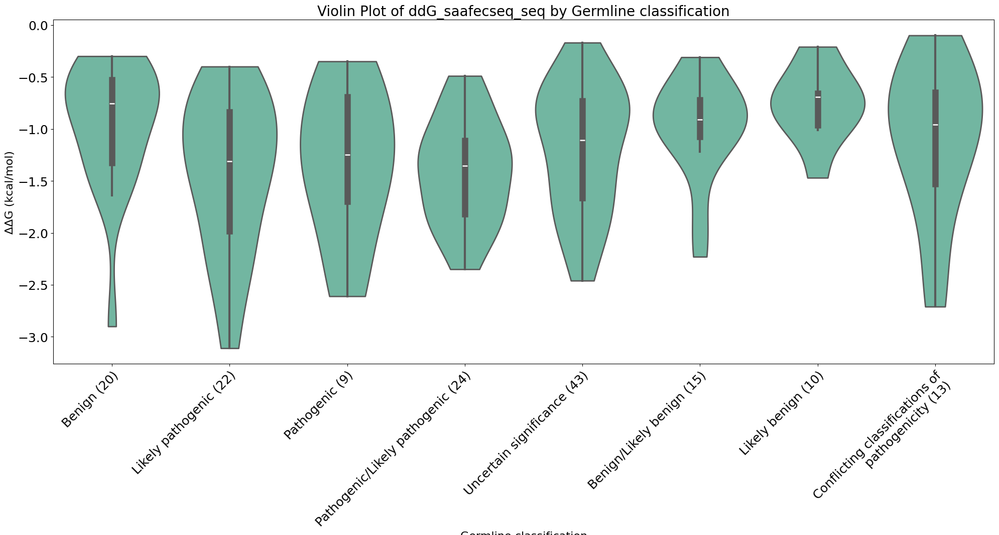

/tmp/ipykernel_24028/3981608796.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_24028/3981608796.py:30: UserWarning: 
The palette list has fewer values (1) than needed (8) and will cycle, which may produce an uninterpretable plot.
  sns.violinplot(
/tmp/ipykernel_24028/3981608796.py:30: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='area'` for the same effect.
  sns.violinplot(


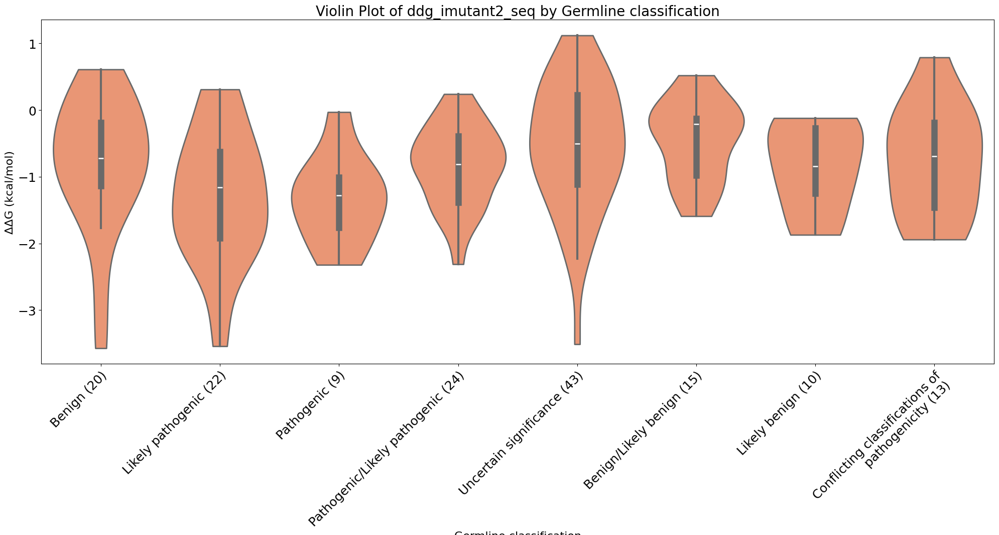

/tmp/ipykernel_24028/3981608796.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_24028/3981608796.py:30: UserWarning: 
The palette list has fewer values (1) than needed (8) and will cycle, which may produce an uninterpretable plot.
  sns.violinplot(
/tmp/ipykernel_24028/3981608796.py:30: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='area'` for the same effect.
  sns.violinplot(


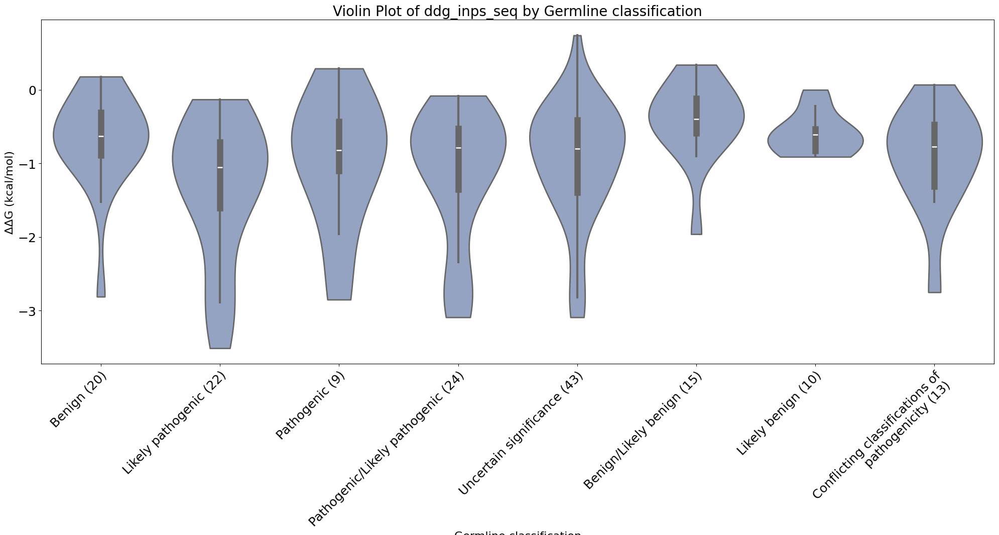

/tmp/ipykernel_24028/3981608796.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_24028/3981608796.py:30: UserWarning: 
The palette list has fewer values (1) than needed (8) and will cycle, which may produce an uninterpretable plot.
  sns.violinplot(
/tmp/ipykernel_24028/3981608796.py:30: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='area'` for the same effect.
  sns.violinplot(


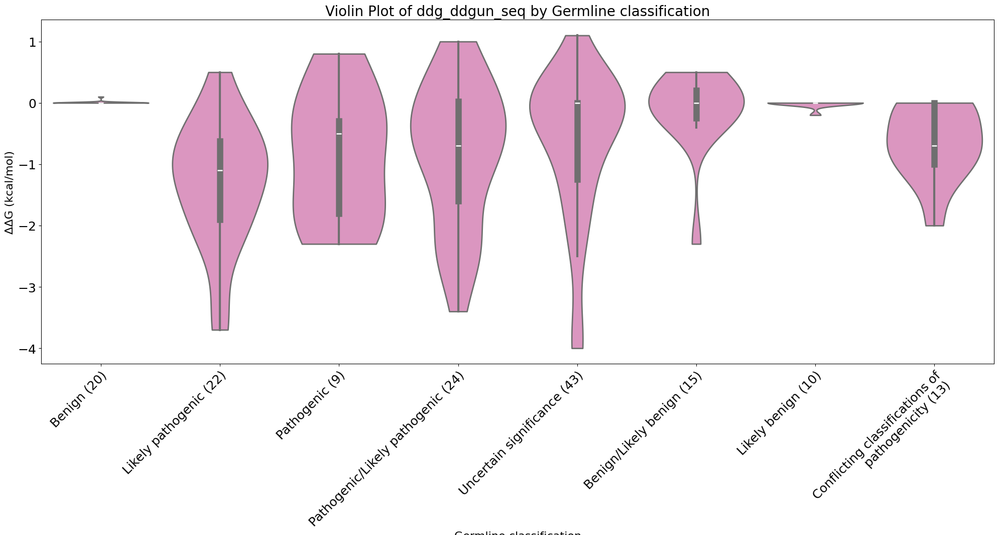

/tmp/ipykernel_24028/3981608796.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_24028/3981608796.py:30: UserWarning: 
The palette list has fewer values (1) than needed (8) and will cycle, which may produce an uninterpretable plot.
  sns.violinplot(
/tmp/ipykernel_24028/3981608796.py:30: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='area'` for the same effect.
  sns.violinplot(


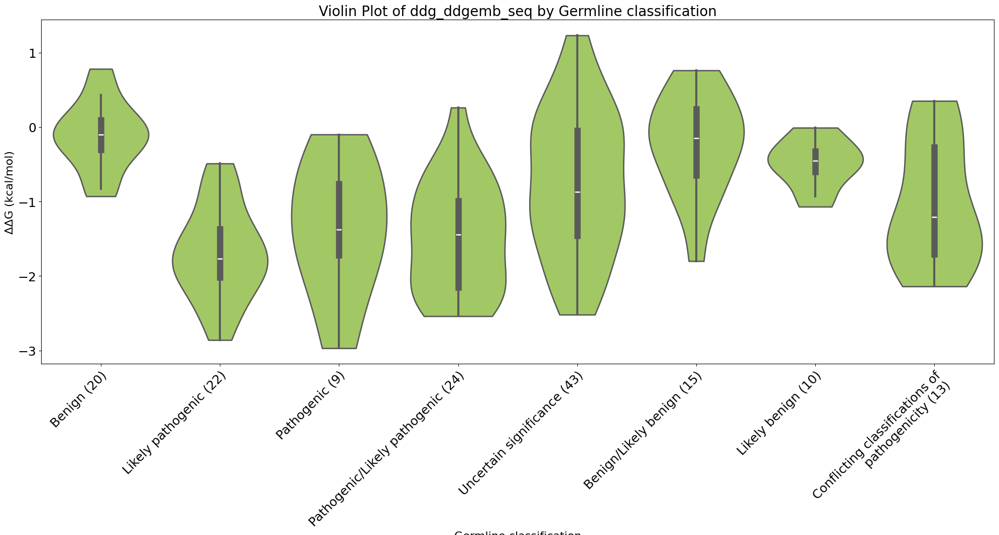

PDF saved as cdkl5_ddg_violinplot_landscape_per_method.pdf


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.backends.backend_pdf import PdfPages

# Load the data
file_path = "/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/00_data/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq_af.xlsx"
df = pd.read_excel(file_path, sheet_name=0)

# Find all sequence-based ddG columns (e.g., ddgsaafecseq, ddgimutantseq, etc.)
ddg_seq_cols = [col for col in df.columns if col.lower().startswith("ddg") and col.lower().endswith("seq")]

if not ddg_seq_cols:
    print("No sequence-based ddG columns found (columns matching 'ddg*seq').")
else:
    # Add value counts to Germline classification labels (just 'GroupName (count)')
    value_counts = df['Germline classification'].value_counts()
    def wrap_label(label, count):
        return f"{label} ({count})"
    label_map = {k: wrap_label(k, v) for k, v in value_counts.items()}
    df['Germline classification (count)'] = df['Germline classification'].map(label_map)

    # Set color palette for methods
    palette = sns.color_palette("Set2", n_colors=len(ddg_seq_cols))

    # Create a PDF to save all plots
    with PdfPages("/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/02_stability/10_output/cdkl5_ddg_violinplot_landscape_per_method.pdf") as pdf:
        for i, ddg_col in enumerate(ddg_seq_cols):
            plt.figure(figsize=(20, 10))
            sns.violinplot(
                data=df,
                x="Germline classification (count)",
                y=ddg_col,
                palette=[palette[i]],
                inner="box",
                cut=0,
                scale="area",
                linewidth=2
            )
            plt.title(f"Violin Plot of {ddg_col} by Germline classification", fontsize=20)
            plt.xlabel("Germline classification", fontsize=16)
            plt.ylabel("ΔΔG (kcal/mol)", fontsize=16)
            plt.xticks(rotation=45, fontsize=18, ha='right', wrap=True)  # <-- 45 degree angle
            plt.yticks(fontsize=18)
            plt.tight_layout(rect=[0, 0, 1, 1])
            pdf.savefig(bbox_inches='tight', orientation='landscape')
            plt.show()
            plt.close()
    print("PDF saved as cdkl5_ddg_violinplot_landscape_per_method.pdf")


## 9.5 Only Benign and Pathogenic

/tmp/ipykernel_24028/1984465694.py:43: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='area'` for the same effect.
  sns.violinplot(


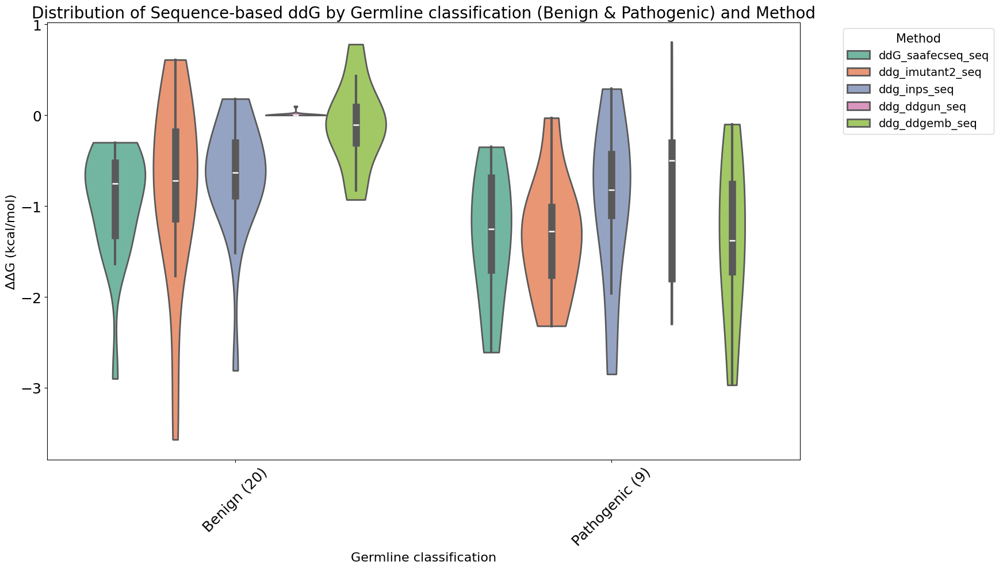

PDF saved as /mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/02_stability/10_output/cdkl5_ddg_violinplot_landscape_benign_pathogenic_all_methods.pdf


In [ ]:
# Violin plot: All sequence-based ddG methods, only 'Benign' and 'Pathogenic', all methods as hue in one plot

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.backends.backend_pdf import PdfPages

# Load the data
file_path = "/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/00_data/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq_af.xlsx"
df = pd.read_excel(file_path, sheet_name=0)

# Filter for only 'Benign' and 'Pathogenic'
df_filtered = df[df['Germline classification'].isin(['Benign', 'Pathogenic'])].copy()

# Find all sequence-based ddG columns (e.g., ddgsaafecseq, ddgimutantseq, etc.)
ddg_seq_cols = [col for col in df_filtered.columns if col.lower().startswith("ddg") and col.lower().endswith("seq")]

if not ddg_seq_cols:
    print("No sequence-based ddG columns found (columns matching 'ddg*seq').")
else:
    # Add value counts to Germline classification labels
    value_counts = df_filtered['Germline classification'].value_counts()
    def wrap_label(label, count):
        return f"{label} ({count})"
    label_map = {k: wrap_label(k, v) for k, v in value_counts.items()}
    df_filtered['Germline classification (count)'] = df_filtered['Germline classification'].map(label_map)

    # Melt the dataframe for seaborn
    plot_df = df_filtered.melt(
        id_vars=["Germline classification (count)"],
        value_vars=ddg_seq_cols,
        var_name="Method",
        value_name="ddG"
    )

    # Set color palette for methods
    palette = sns.color_palette("Set2", n_colors=len(ddg_seq_cols))

    # Create a PDF in landscape mode
    output_pdf = "/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/02_stability/10_output/cdkl5_ddg_violinplot_landscape_benign_pathogenic_all_methods.pdf"
    with PdfPages(output_pdf) as pdf:
        plt.figure(figsize=(20, 10))
        sns.violinplot(
            data=plot_df,
            x="Germline classification (count)",
            y="ddG",
            hue="Method",
            palette=palette,
            inner="box",
            cut=0,
            scale="area",
            linewidth=2
        )
        plt.title("Distribution of Sequence-based ddG by Germline classification (Benign & Pathogenic) and Method", fontsize=20)
        plt.xlabel("Germline classification", fontsize=16)
        plt.ylabel("ΔΔG (kcal/mol)", fontsize=16)
        plt.xticks(rotation=45, fontsize=18)
        plt.yticks(fontsize=18)
        plt.legend(title="Method", bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=14, title_fontsize=15)
        plt.tight_layout(rect=[0, 0, 0.88, 1])  # Make room for legend
        pdf.savefig(bbox_inches='tight', orientation='landscape')
        plt.show()
        plt.close()
    print(f"PDF saved as {output_pdf}")


## 9.6 Structure based 

## 9.6.1 Distribution of structure-based ddG by Germline classification (Violin Plot)

Visualize the distribution of ddG values from all structure-based methods (columns matching 'ddg*str') across different 'Germline classification' groups. Each method is shown in a different color for clarity.

/tmp/ipykernel_24028/218729380.py:39: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='area'` for the same effect.
  sns.violinplot(


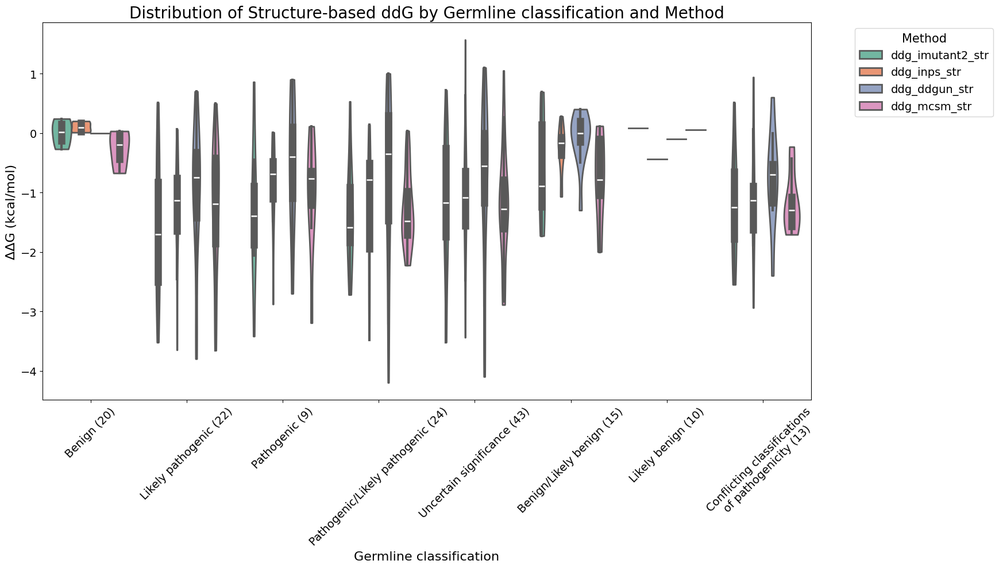

PDF saved as cdkl5_ddgstr_violinplot_landscape.pdf


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.backends.backend_pdf import PdfPages

# Load the data
file_path = "/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/00_data/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq_af.xlsx"
df = pd.read_excel(file_path, sheet_name=0)

# Find all structure-based ddG columns (e.g., ddgsaafecstr, ddgimutantstr, etc.)
ddg_str_cols = [col for col in df.columns if col.lower().startswith("ddg") and col.lower().endswith("str")]

if not ddg_str_cols:
    print("No structure-based ddG columns found (columns matching 'ddg*str').")
else:
    # Add value counts to Germline classification labels
    value_counts = df['Germline classification'].value_counts()
    def wrap_label(label, count):
        # Insert a line break after every two words
        words = str(label).split()
        wrapped = ''
        for i, word in enumerate(words):
            if i > 0 and i % 2 == 0:
                wrapped += '\n'
            elif i > 0:
                wrapped += ' '
            wrapped += word
        return f"{wrapped} ({count})"
    label_map = {k: wrap_label(k, v) for k, v in value_counts.items()}
    df['Germline classification (count)'] = df['Germline classification'].map(label_map)
    # Melt the dataframe for seaborn
    plot_df = df.melt(id_vars=["Germline classification (count)"], value_vars=ddg_str_cols,
                     var_name="Method", value_name="ddG")
    # Set color palette for methods
    palette = sns.color_palette("Set2", n_colors=len(ddg_str_cols))
    # Create a PDF in landscape mode
    with PdfPages("/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/02_stability/10_output/cdkl5_ddgstr_violinplot_landscape.pdf") as pdf:
        plt.figure(figsize=(20, 10))  # Make the violin plot larger
        sns.violinplot(
            data=plot_df,
            x="Germline classification (count)",
            y="ddG",
            hue="Method",
            palette=palette,
            inner="box",
            cut=0,
            scale="area",  # Make violins wider
            linewidth=2    # Thicker outline for better appearance
        )
        plt.title("Distribution of Structure-based ddG by Germline classification and Method", fontsize=20)
        plt.xlabel("Germline classification", fontsize=16)
        plt.ylabel("ΔΔG (kcal/mol)", fontsize=16)
        plt.xticks(rotation=45, fontsize=14)
        plt.yticks(fontsize=14)
        plt.legend(title="Method", bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=14, title_fontsize=15)
        plt.tight_layout(rect=[0, 0, 0.88, 1])  # Make room for legend
        pdf.savefig(bbox_inches='tight', orientation='landscape')
        plt.show()
        plt.close()
    print("PDF saved as cdkl5_ddgstr_violinplot_landscape.pdf")

## 9.6.2 Structure-based ddG: One method per plot

Each structure-based ddG method (columns matching 'ddg*str') is shown in a separate violin plot, grouped by Germline classification. All plots are saved to a single landscape PDF, one page per method.

/tmp/ipykernel_24028/2396448964.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_24028/2396448964.py:30: UserWarning: 
The palette list has fewer values (1) than needed (8) and will cycle, which may produce an uninterpretable plot.
  sns.violinplot(
/tmp/ipykernel_24028/2396448964.py:30: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='area'` for the same effect.
  sns.violinplot(


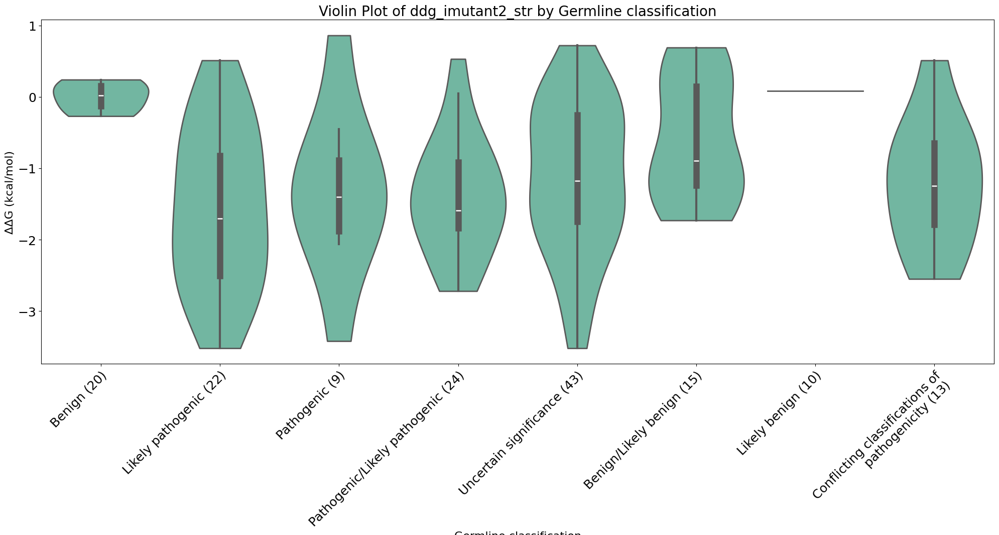

/tmp/ipykernel_24028/2396448964.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_24028/2396448964.py:30: UserWarning: 
The palette list has fewer values (1) than needed (8) and will cycle, which may produce an uninterpretable plot.
  sns.violinplot(
/tmp/ipykernel_24028/2396448964.py:30: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='area'` for the same effect.
  sns.violinplot(


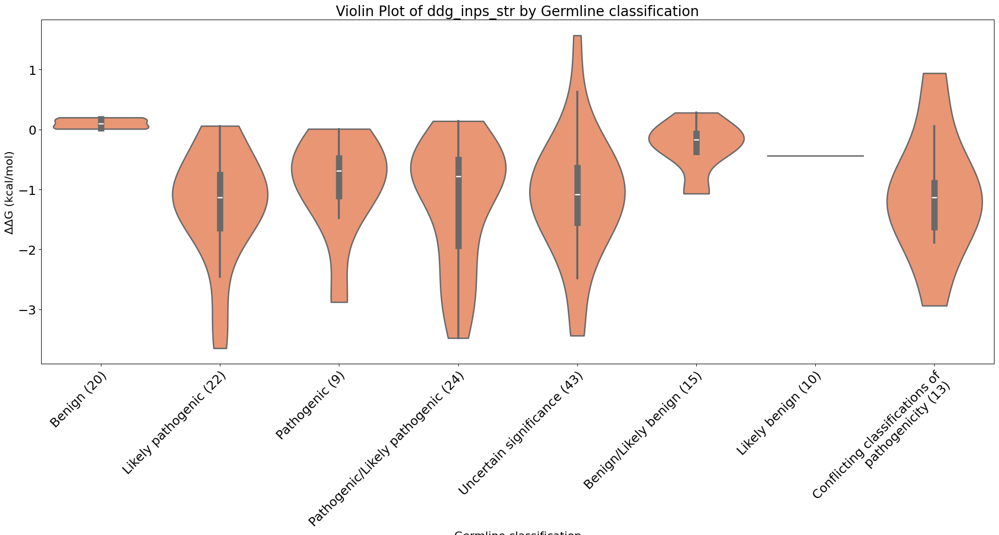

/tmp/ipykernel_24028/2396448964.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_24028/2396448964.py:30: UserWarning: 
The palette list has fewer values (1) than needed (8) and will cycle, which may produce an uninterpretable plot.
  sns.violinplot(
/tmp/ipykernel_24028/2396448964.py:30: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='area'` for the same effect.
  sns.violinplot(


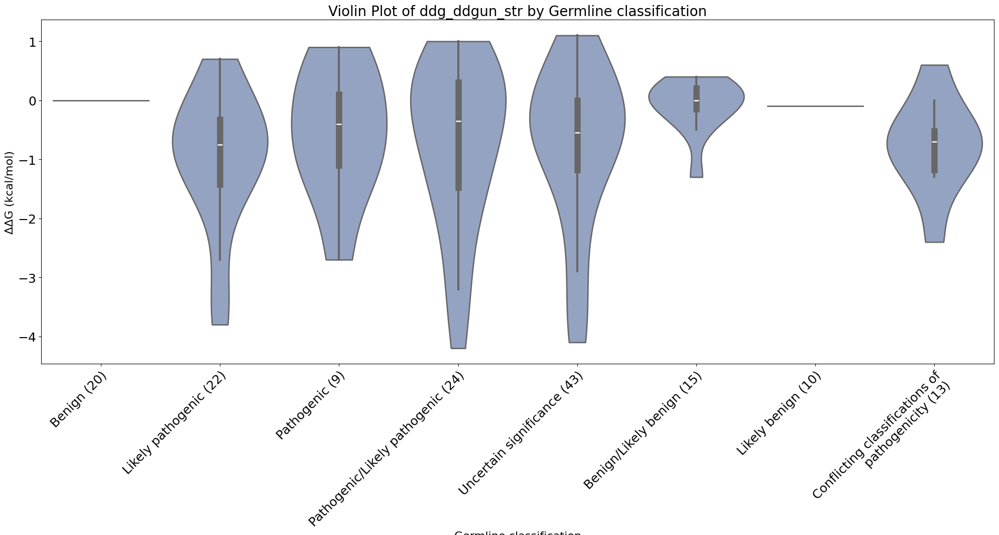

/tmp/ipykernel_24028/2396448964.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_24028/2396448964.py:30: UserWarning: 
The palette list has fewer values (1) than needed (8) and will cycle, which may produce an uninterpretable plot.
  sns.violinplot(
/tmp/ipykernel_24028/2396448964.py:30: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='area'` for the same effect.
  sns.violinplot(


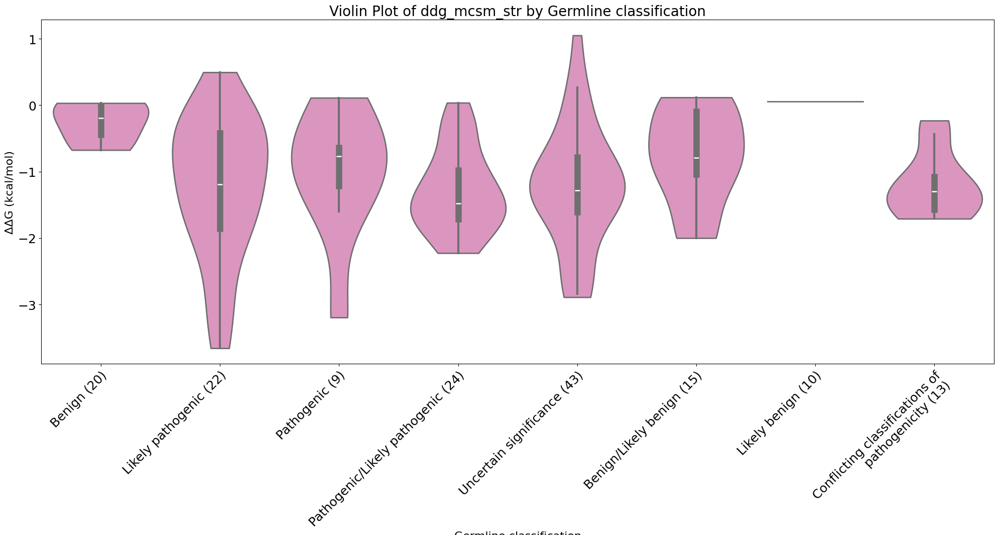

PDF saved as cdkl5_ddgstr_violinplot_landscape_per_method.pdf


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.backends.backend_pdf import PdfPages

# Load the data
file_path = "/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/00_data/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq_af.xlsx"
df = pd.read_excel(file_path, sheet_name=0)

# Find all structure-based ddG columns (e.g., ddgsaafecstr, ddgimutantstr, etc.)
ddg_str_cols = [col for col in df.columns if col.lower().startswith("ddg") and col.lower().endswith("str")]

if not ddg_str_cols:
    print("No structure-based ddG columns found (columns matching 'ddg*str').")
else:
    # Add value counts to Germline classification labels (just 'GroupName (count)')
    value_counts = df['Germline classification'].value_counts()
    def wrap_label(label, count):
        return f"{label} ({count})"
    label_map = {k: wrap_label(k, v) for k, v in value_counts.items()}
    df['Germline classification (count)'] = df['Germline classification'].map(label_map)

    # Set color palette for methods
    palette = sns.color_palette("Set2", n_colors=len(ddg_str_cols))

    # Create a PDF to save all plots
    with PdfPages("/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/02_stability/10_output/cdkl5_ddgstr_violinplot_landscape_per_method.pdf") as pdf:
        for i, ddg_col in enumerate(ddg_str_cols):
            plt.figure(figsize=(20, 10))
            sns.violinplot(
                data=df,
                x="Germline classification (count)",
                y=ddg_col,
                palette=[palette[i]],
                inner="box",
                cut=0,
                scale="area",
                linewidth=2
            )
            plt.title(f"Violin Plot of {ddg_col} by Germline classification", fontsize=20)
            plt.xlabel("Germline classification", fontsize=16)
            plt.ylabel("ΔΔG (kcal/mol)", fontsize=16)
            plt.xticks(rotation=45, fontsize=18, ha='right', wrap=True)  # <-- 45 degree angle
            plt.yticks(fontsize=18)
            plt.tight_layout(rect=[0, 0, 1, 1])
            pdf.savefig(bbox_inches='tight', orientation='landscape')
            plt.show()
            plt.close()
    print("PDF saved as cdkl5_ddgstr_violinplot_landscape_per_method.pdf")

## 9.6.3 Structure-based ddG: All methods side-by-side (2 columns per page, improved legend and font size control)

This cell generates a single PDF page with all structure-based ddG method violin plots arranged side by side in a two-column layout, grouped by Germline classification. Use the `plot_fontsize` parameter to adjust font sizes.

## SEQ

/tmp/ipykernel_27120/1238553275.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_27120/1238553275.py:31: UserWarning: 
The palette list has fewer values (1) than needed (8) and will cycle, which may produce an uninterpretable plot.
  sns.violinplot(
/tmp/ipykernel_27120/1238553275.py:31: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='area'` for the same effect.
  sns.violinplot(
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
/tmp/ipykernel_27120/1238553275.py:31: FutureWarning: 

Passing `pale

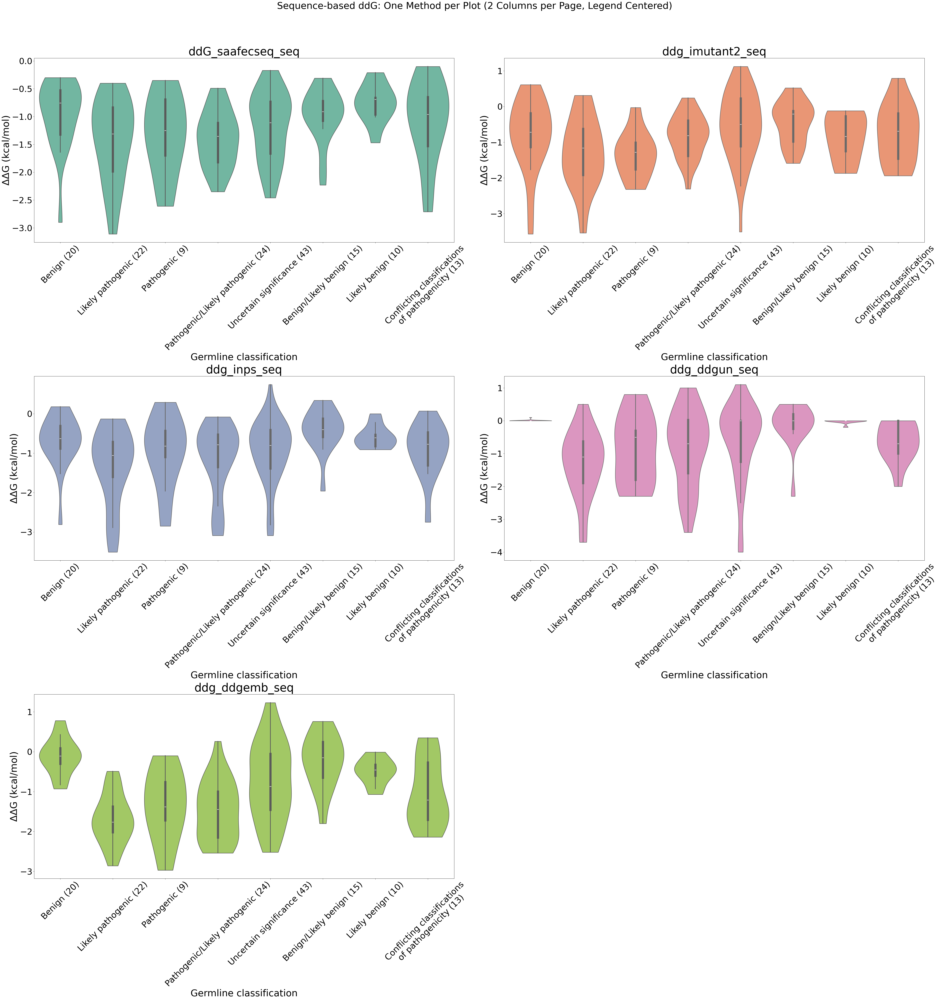

PDF saved as /mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/02_stability/10_output/cdkl5_ddg_violinplot_seq_2col_centered.pdf


In [ ]:
# Sequence-based ddG: One Method per Plot, Two Columns per Page, Legend Centered (linebreak after every keyword or symbol, font size easily tweakable)
#This script generates a PDF with all sequence-based ddG methods, one per subplot, arranged in a two-column layout per page. The legend uses a linebreak after every keyword or symbol (including slashes), and the PDF size is increased (wider and taller) to ensure the legend is visually centered above the x-axis, even with 45-degree x-tick labels. Font size is easily tweakable via function arguments and is set to 2x the previous default.

import math
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.backends.backend_pdf import PdfPages
import re

def wrap_legend_label(label):
    # Split on whitespace and also on slashes, keeping slashes as their own line
    tokens = re.split(r'([/])|\\s+', str(label))
    tokens = [t for t in tokens if t and not t.isspace()]
    return '\n'.join(tokens) if len(tokens) > 1 else label

def plot_ddg_methods_2col_centered(
    df, ddg_cols, output_pdf, plot_title,
    plot_fontsize=32, legend_fontsize=26, legend_title_fontsize=30, suptitle_fontsize=38,
    fig_width=56, fig_height_per_row=20
):
    n_methods = len(ddg_cols)
    n_cols = 2
    n_rows = math.ceil(n_methods / n_cols)
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(fig_width, fig_height_per_row * n_rows), squeeze=False)
    palette = sns.color_palette("Set2", n_colors=n_methods)
    for idx, ddg_col in enumerate(ddg_cols):
        row = idx // n_cols
        col = idx % n_cols
        ax = axes[row, col]
        sns.violinplot(
            data=df,
            x="Germline classification (count)",
            y=ddg_col,
            palette=[palette[idx]],
            inner="box",
            cut=0,
            scale="area",
            linewidth=2,
            ax=ax
        )
        ax.set_title(f"{ddg_col}", fontsize=plot_fontsize+8)
        ax.set_xlabel("Germline classification", fontsize=plot_fontsize)
        ax.set_ylabel("ΔΔG (kcal/mol)", fontsize=plot_fontsize)
        ax.tick_params(axis='x', rotation=45, labelsize=plot_fontsize-4)
        ax.tick_params(axis='y', labelsize=plot_fontsize-4)
        handles, labels = ax.get_legend_handles_labels()
        if handles:
            wrapped_labels = [wrap_legend_label(l) for l in labels]
            ax.legend(
                handles, wrapped_labels, title="Method",
                loc='upper center', bbox_to_anchor=(0.5, 1.18),
                fontsize=legend_fontsize, title_fontsize=legend_title_fontsize, frameon=True, borderaxespad=0.2, ncol=1, alignment='center'
            )
        else:
            ax.legend().remove()
    for idx in range(n_methods, n_rows * n_cols):
        fig.delaxes(axes[idx // n_cols, idx % n_cols])
    plt.suptitle(plot_title, fontsize=suptitle_fontsize)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    with PdfPages(output_pdf) as pdf:
        pdf.savefig(fig, bbox_inches='tight', orientation='landscape')
    plt.show()
    plt.close(fig)
    print(f"PDF saved as {output_pdf}")

# --- Sequence-based ddG ---
file_path = "/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/00_data/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq_af.xlsx"
df = pd.read_excel(file_path, sheet_name=0)
ddg_seq_cols = [col for col in df.columns if col.lower().startswith("ddg") and col.lower().endswith("seq")]
if ddg_seq_cols:
    value_counts = df['Germline classification'].value_counts()
    def wrap_label(label, count):
        words = str(label).split()
        wrapped = ''
        for i, word in enumerate(words):
            if i > 0 and i % 2 == 0:
                wrapped += '\n'
            elif i > 0:
                wrapped += ' '
            wrapped += word
        return f"{wrapped} ({count})"
    label_map = {k: wrap_label(k, v) for k, v in value_counts.items()}
    df['Germline classification (count)'] = df['Germline classification'].map(label_map)
    output_pdf_seq = "/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/02_stability/10_output/cdkl5_ddg_violinplot_seq_2col_centered.pdf"
    plot_ddg_methods_2col_centered(
        df,
        ddg_seq_cols,
        output_pdf_seq,
        plot_title="Sequence-based ddG: One Method per Plot (2 Columns per Page, Legend Centered)",
        plot_fontsize=40,
        legend_fontsize=40,
        legend_title_fontsize=40,
        suptitle_fontsize=40,
        fig_width=56,
        fig_height_per_row=20
    )

## STR

/tmp/ipykernel_34940/1007720376.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_34940/1007720376.py:30: UserWarning: 
The palette list has fewer values (1) than needed (8) and will cycle, which may produce an uninterpretable plot.
  sns.violinplot(
/tmp/ipykernel_34940/1007720376.py:30: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='area'` for the same effect.
  sns.violinplot(
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
/tmp/ipykernel_34940/1007720376.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sn

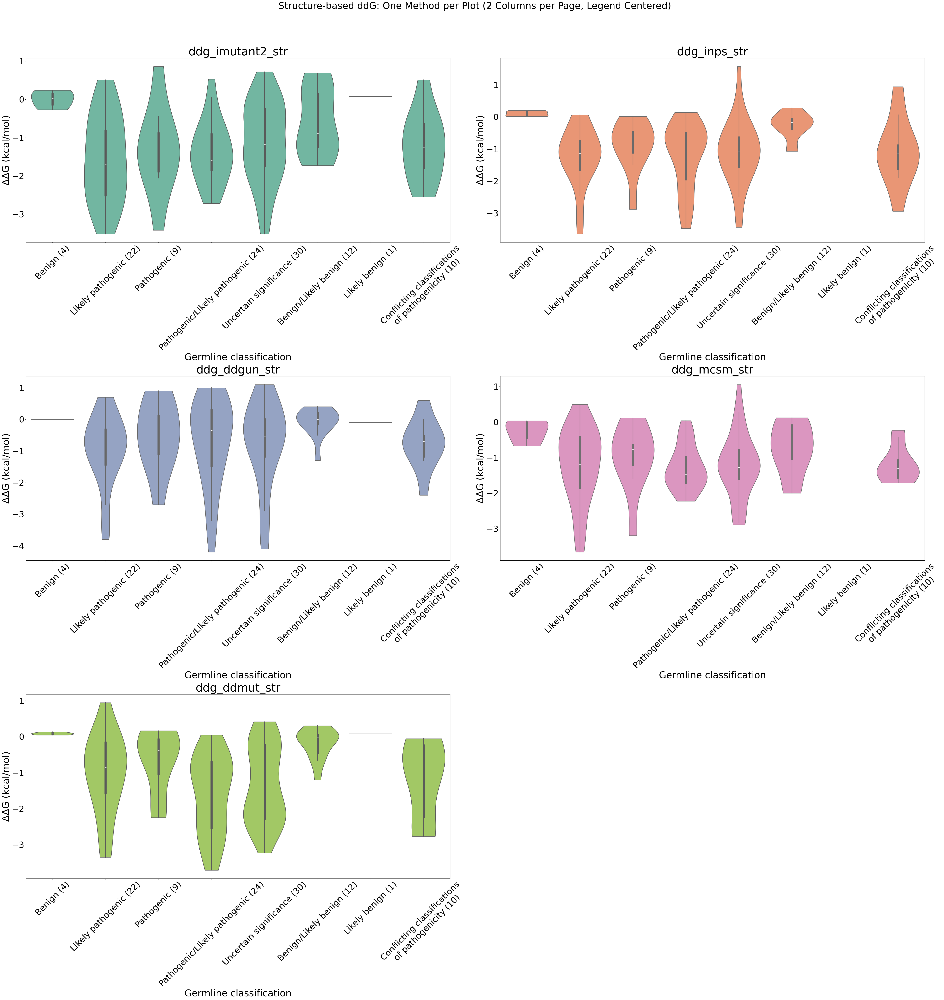

PDF saved as /mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/02_stability/10_output/cdkl5_ddg_violinplot_str_2col_centered.pdf


In [ ]:
# --- Structure-based ddG ---
import math
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.backends.backend_pdf import PdfPages
import re

def wrap_legend_label(label):
    # Split on whitespace and also on slashes, keeping slashes as their own line
    tokens = re.split(r'([/])|\\s+', str(label))
    tokens = [t for t in tokens if t and not t.isspace()]
    # Use actual linebreaks for matplotlib legend: join with '\n' and set label to multiline with r-string
    return r'{}'.format('\n'.join(tokens)) if len(tokens) > 1 else label

def plot_ddg_methods_2col_centered(
    df, ddg_cols, output_pdf, plot_title,
    plot_fontsize=32, legend_fontsize=26, legend_title_fontsize=30, suptitle_fontsize=38,
    fig_width=56, fig_height_per_row=20
):
    n_methods = len(ddg_cols)
    n_cols = 2
    n_rows = math.ceil(n_methods / n_cols)
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(fig_width, fig_height_per_row * n_rows), squeeze=False)
    palette = sns.color_palette("Set2", n_colors=n_methods)
    for idx, ddg_col in enumerate(ddg_cols):
        row = idx // n_cols
        col = idx % n_cols
        ax = axes[row, col]
        sns.violinplot(
            data=df,
            x="Germline classification (count)",
            y=ddg_col,
            palette=[palette[idx]],
            inner="box",
            cut=0,
            scale="area",
            linewidth=2,
            ax=ax
        )
        ax.set_title(f"{ddg_col}", fontsize=plot_fontsize+8)
        ax.set_xlabel("Germline classification", fontsize=plot_fontsize)
        ax.set_ylabel("ΔΔG (kcal/mol)", fontsize=plot_fontsize)
        ax.tick_params(axis='x', rotation=45, labelsize=plot_fontsize-4)
        ax.tick_params(axis='y', labelsize=plot_fontsize-4)
        handles, labels = ax.get_legend_handles_labels()
        if handles:
            wrapped_labels = [wrap_legend_label(l) for l in labels]
            # Use labelspacing to help with vertical spacing if needed
            ax.legend(
                handles, wrapped_labels, title="Method",
                loc='upper center', bbox_to_anchor=(0.5, 1.18),
                fontsize=legend_fontsize, title_fontsize=legend_title_fontsize, frameon=True, borderaxespad=0.2, ncol=1, alignment='center', labelspacing=1.2
            )
        else:
            ax.legend().remove()
    for idx in range(n_methods, n_rows * n_cols):
        fig.delaxes(axes[idx // n_cols, idx % n_cols])
    plt.suptitle(plot_title, fontsize=suptitle_fontsize)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    with PdfPages(output_pdf) as pdf:
        pdf.savefig(fig, bbox_inches='tight', orientation='landscape')
    plt.show()
    plt.close(fig)
    print(f"PDF saved as {output_pdf}")

file_path = "/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/00_data/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq_af_str.xlsx"
df = pd.read_excel(file_path, sheet_name=0)
ddg_str_cols = [col for col in df.columns if col.lower().startswith("ddg") and col.lower().endswith("str")]
if ddg_str_cols:
    value_counts = df['Germline classification'].value_counts()
    def wrap_label(label, count):
        words = str(label).split()
        wrapped = ''
        for i, word in enumerate(words):
            if i > 0 and i % 2 == 0:
                wrapped += '\n'
            elif i > 0:
                wrapped += ' '
            wrapped += word
        return f"{wrapped} ({count})"
    label_map = {k: wrap_label(k, v) for k, v in value_counts.items()}
    df['Germline classification (count)'] = df['Germline classification'].map(label_map)
    output_pdf_str = "/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/02_stability/10_output/cdkl5_ddg_violinplot_str_2col_centered.pdf"
    plot_ddg_methods_2col_centered(
        df,
        ddg_str_cols,
        output_pdf_str,
        plot_title="Structure-based ddG: One Method per Plot (2 Columns per Page, Legend Centered)",
        plot_fontsize=40,
        legend_fontsize=40,
        legend_title_fontsize=40,
        suptitle_fontsize=40,
        fig_width=56,
        fig_height_per_row=20
    )


# 10 Analysis 2: Seq based method: two classes range 1-302; 302 -895

## 10.1 testing

In [ ]:
import pandas as pd
from IPython.display import display

file_path = "/mnt/c/Users/paul/works/alexovlab/250218-CDKL5/250513_energy/00_data/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq_af.xlsx"

# Load and display the default (first) sheet
df = pd.read_excel(file_path, sheet_name=0)
display(df)


,Name,Gene(s),Protein change,mutation,wild,position,mutant,Allele Frequency,Condition(s),Accession,...,ddG_saafecseq_seq,ddg_imutant2_seq,ddg_inps_seq,ddg_ddgun_seq,ddg_ddgemb_seq,ddg_imutant2_str,ddg_inps_str,ddg_ddgun_str,ddg_mcsm_str,ddg_ddmut_str
0,ENSP00000369325.3:p.Ile3Phe,CDKL5,I3F,I3F,I,3,F,0.000009,Healthy,NaN,...,-1.64,0.07,-1.01,0.0,-0.14,-0.27,0.16,0.0,-0.675,0.04
1,ENSP00000369325.3:p.Asn5Asp,CDKL5,N5D,N5D,N,5,D,0.000003,Healthy,NaN,...,-0.49,-0.37,0.08,0.0,-0.40,-0.08,0.01,0.0,0.031,0.09
2,NM_001323289.2(CDKL5):c.38T>C (p.Phe13Ser),CDKL5,F13S,F13S,F,13,S,NaN,CDKL5 disorder,VCV000929426,...,-3.11,-2.90,-2.89,-1.9,-2.86,-2.97,-1.77,-2.7,-3.658,-3.35
3,NM_001323289.2(CDKL5):c.58G>C (p.Gly20Arg),CDKL5,G20R,G20R,G,20,R,NaN,"Developmental and epileptic encephalopathy, 2|...",VCV000143828,...,-1.25,-1.52,-0.43,-0.5,-1.65,-1.40,-0.63,-0.1,-0.649,-0.08
4,NM_001323289.2(CDKL5):c.59G>T (p.Gly20Val),CDKL5,G20V,G20V,G,20,V,NaN,CDKL5 disorder,VCV000918032,...,-1.18,-0.97,-1.09,-0.5,-2.29,-0.89,-0.69,0.1,-0.127,-0.39
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
151,NM_001323289.2(CDKL5):c.2546C>T (p.Ser849Leu),CDKL5,S849L,S849L,S,849,L,0.000007,CDKL5 disorder,VCV000422765,...,-0.76,-0.27,-0.88,0.0,-0.17,NaN,NaN,NaN,NaN,NaN
152,NM_001323289.2(CDKL5):c.2555C>T (p.Pro852Leu),CDKL5,P852L,P852L,P,852,L,0.000025,CDKL5 disorder,VCV000156690,...,-0.40,-0.31,-0.79,0.0,0.06,NaN,NaN,NaN,NaN,NaN
153,NM_001323289.2(CDKL5):c.2572C>T (p.Arg858Cys),CDKL5,R858C,R858C,R,858,C,0.000026,not provided|CDKL5 disorder|Angelman syndrome-...,VCV000426292,...,-0.65,-0.19,-0.45,0.0,-0.27,NaN,NaN,NaN,NaN,NaN
154,ENSP00000369325.3:p.Arg890Gln,CDKL5,R890Q,R890Q,R,890,Q,NaN,Healthy,NaN,...,-0.77,-0.36,-0.38,0.0,-0.24,NaN,NaN,NaN,NaN,NaN


In [2]:
import pandas as pd

file_path = "00_data/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq_af.xlsx"
df = pd.read_excel(file_path, sheet_name=0)

def germline_classification_counts_with_total(df, column='Germline classification'):
    counts = df[column].value_counts(dropna=False)
    total = counts.sum()
    print("Germline classification counts:\n", counts)
    print("\nTotal count:", total)
    return counts, total

# Usage
counts, total = germline_classification_counts_with_total(df)

Germline classification counts:
 Germline classification
Uncertain significance                          43
Pathogenic/Likely pathogenic                    24
Likely pathogenic                               22
Benign                                          20
Benign/Likely benign                            15
Conflicting classifications of pathogenicity    13
Likely benign                                   10
Pathogenic                                       9
Name: count, dtype: int64

Total count: 156


In [3]:
# Load only the first row to get column names of sheet 0
df = pd.read_excel(file_path, sheet_name=0, nrows=0)
print("Columns in sheet 0:")
print(df.columns.tolist())

Columns in sheet 0:
['Name', 'Gene(s)', 'Protein change', 'mutation', 'wild', 'position', 'mutant', 'Allele Frequency', 'Condition(s)', 'Accession', 'GRCh37Chromosome', 'GRCh37Location', 'GRCh38Chromosome', 'GRCh38Location', 'VariationID', 'AlleleID(s)', 'dbSNP ID', 'Canonical SPDI', 'Variant type', 'Molecular consequence', 'Germline classification', 'Source', 'Germline date last evaluated', 'Germline review status', 'ddG_saafecseq_seq', 'ddg_imutant2_seq', 'ddg_inps_seq', 'ddg_ddgun_seq', 'ddg_ddgemb_seq', 'ddg_imutant2_str', 'ddg_inps_str', 'ddg_ddgun_str', 'ddg_mcsm_str', 'ddg_ddmut_str']


In [5]:
import pandas as pd
import re

file_path = "00_data/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq_af.xlsx"
df = pd.read_excel(file_path, sheet_name=0)

# Use a regex to match any column that contains 'ddg' (case-insensitive) and 'seq' at the end, with anything in between
ddg_seq_cols = [col for col in df.columns if re.match(r'(?i)^ddg.*seq$', col)]

print(f"Number of detected ddg*seq columns: {len(ddg_seq_cols)}")
print("Columns:", ddg_seq_cols)

Number of detected ddg*seq columns: 5
Columns: ['ddG_saafecseq_seq', 'ddg_imutant2_seq', 'ddg_inps_seq', 'ddg_ddgun_seq', 'ddg_ddgemb_seq']


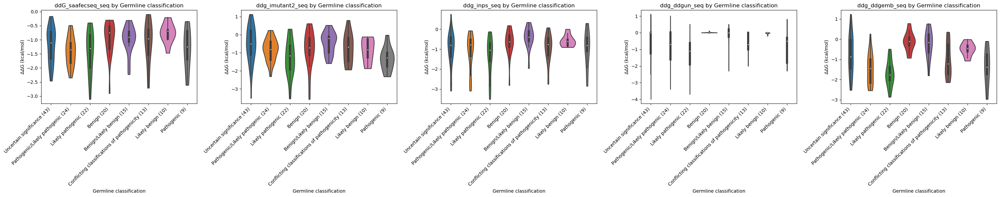

In [6]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re

file_path = "00_data/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq_af.xlsx"
df = pd.read_excel(file_path, sheet_name=0)

# Identify sequence-based ddg columns using regex (case-insensitive)
ddg_seq_cols = [col for col in df.columns if re.match(r'(?i)^ddg.*seq$', col)]

# Prepare labels with value counts
class_counts = df['Germline classification'].value_counts()
order = class_counts.index.tolist()
labels_with_counts = [f"{cls} ({class_counts[cls]})" for cls in order]

# For mapping old to new labels
label_map = dict(zip(order, labels_with_counts))
df['Germline classification (count)'] = df['Germline classification'].map(label_map)

# Violin plots
plt.figure(figsize=(6 * len(ddg_seq_cols), 6))
for i, col in enumerate(ddg_seq_cols, 1):
    plt.subplot(1, len(ddg_seq_cols), i)
    sns.violinplot(
        data=df,
        x='Germline classification (count)',
        y=col,
        order=labels_with_counts,
        inner='box',
        cut=0
    )
    plt.title(f'{col} by Germline classification')
    plt.xlabel('Germline classification')
    plt.ylabel('ΔΔG (kcal/mol)')
    plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()

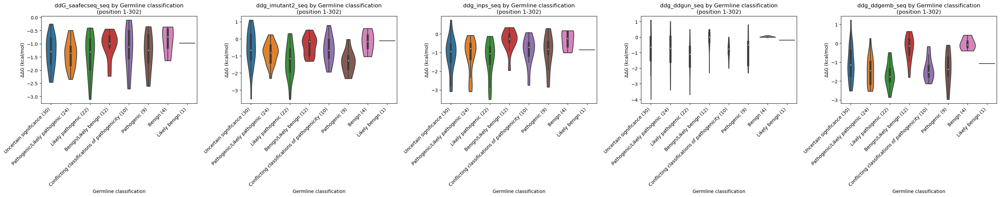

In [8]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re

file_path = "00_data/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq_af.xlsx"
df = pd.read_excel(file_path, sheet_name=0)

# Filter rows where position is between 1 and 302 (inclusive)
df_in_range = df[(df['position'] >= 1) & (df['position'] <= 302)].copy()

# Identify sequence-based ddg columns using regex (case-insensitive)
ddg_seq_cols = [col for col in df_in_range.columns if re.match(r'(?i)^ddg.*seq$', col)]

# Prepare labels with value counts (only from filtered rows)
class_counts = df_in_range['Germline classification'].value_counts()
order = class_counts.index.tolist()
labels_with_counts = [f"{cls} ({class_counts[cls]})" for cls in order]

# For mapping old to new labels
label_map = dict(zip(order, labels_with_counts))
df_in_range['Germline classification (count)'] = df_in_range['Germline classification'].map(label_map)

# Violin plots
plt.figure(figsize=(6 * len(ddg_seq_cols), 6))
for i, col in enumerate(ddg_seq_cols, 1):
    plt.subplot(1, len(ddg_seq_cols), i)
    sns.violinplot(
        data=df_in_range,
        x='Germline classification (count)',
        y=col,
        order=labels_with_counts,
        inner='box',
        cut=0
    )
    plt.title(f'{col} by Germline classification\n(position 1-302)')
    plt.xlabel('Germline classification')
    plt.ylabel('ΔΔG (kcal/mol)')
    plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()

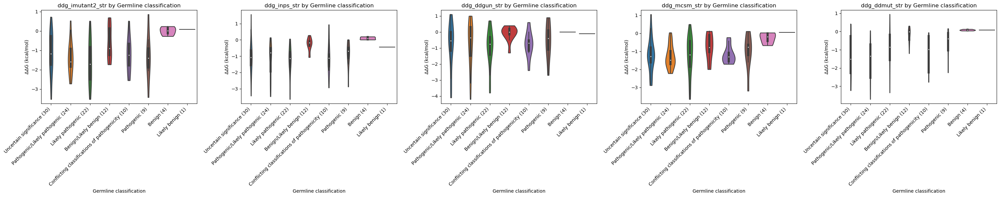

In [9]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re

file_path = "00_data/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq_af.xlsx"
df = pd.read_excel(file_path, sheet_name=0)

# Identify structure-based ddg columns using regex (case-insensitive)
ddg_str_cols = [col for col in df.columns if re.match(r'(?i)^ddg.*str$', col)]

# Prepare filtered DataFrames and class_counts for each ddg*str column
filtered_dfs = []
labels_with_counts_list = []

for col in ddg_str_cols:
    filtered_df = df[~df[col].isna()].copy()
    class_counts = filtered_df['Germline classification'].value_counts()
    order = class_counts.index.tolist()
    labels_with_counts = [f"{cls} ({class_counts[cls]})" for cls in order]
    label_map = dict(zip(order, labels_with_counts))
    filtered_df['Germline classification (count)'] = filtered_df['Germline classification'].map(label_map)
    filtered_dfs.append(filtered_df)
    labels_with_counts_list.append(labels_with_counts)

# Plot side by side
plt.figure(figsize=(6 * len(ddg_str_cols), 6))
for i, (col, filtered_df, labels_with_counts) in enumerate(zip(ddg_str_cols, filtered_dfs, labels_with_counts_list), 1):
    plt.subplot(1, len(ddg_str_cols), i)
    sns.violinplot(
        data=filtered_df,
        x='Germline classification (count)',
        y=col,
        order=labels_with_counts,
        inner='box',
        cut=0
    )
    plt.title(f'{col} by Germline classification')
    plt.xlabel('Germline classification')
    plt.ylabel('ΔΔG (kcal/mol)')
    plt.xticks(rotation=45, ha='right')

plt.tight_layout()
plt.show()

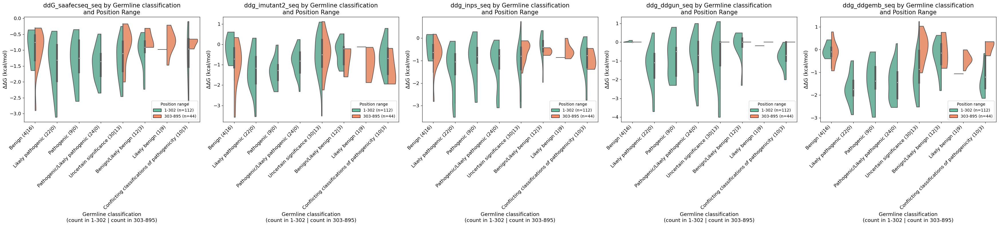

In [10]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re
from matplotlib.patches import Patch

file_path = "00_data/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq_af.xlsx"
df = pd.read_excel(file_path, sheet_name=0)

# Identify sequence-based ddg columns using regex (case-insensitive)
ddg_seq_cols = [col for col in df.columns if re.match(r'(?i)^ddg.*seq$', col)]

# Define position ranges
ranges = {
    '1-302': (1, 302),
    '303-895': (303, 895)
}
range_order = list(ranges.keys())

# Assign position range
def assign_range(pos):
    if pd.isnull(pos):
        return None
    for range_name, (low, high) in ranges.items():
        if low <= pos <= high:
            return range_name
    return None

df['Position range'] = df['position'].apply(assign_range)
df_filtered = df[df['Position range'].isin(ranges.keys())].copy()

# Build composite labels: "Germline classification (count in 1-302 | count in 303-895)"
gc_labels = []
label_map = {}
order = []

for gc in df_filtered['Germline classification'].dropna().unique():
    count_1_302 = df_filtered[(df_filtered['Germline classification'] == gc) & (df_filtered['Position range'] == '1-302')].shape[0]
    count_303_895 = df_filtered[(df_filtered['Germline classification'] == gc) & (df_filtered['Position range'] == '303-895')].shape[0]
    label = f"{gc} ({count_1_302}|{count_303_895})"
    gc_labels.append(label)
    label_map[gc] = label
    order.append(gc)

# Map to composite labels
df_filtered['Germline classification (counts)'] = df_filtered['Germline classification'].map(label_map)

# Custom colors for position ranges (pick two distinct colors)
palette = sns.color_palette("Set2", n_colors=2)
range_color_map = dict(zip(range_order, palette))

# Plotting
plt.figure(figsize=(7 * len(ddg_seq_cols), 8))
for i, col in enumerate(ddg_seq_cols, 1):
    plt.subplot(1, len(ddg_seq_cols), i)
    ax = sns.violinplot(
        data=df_filtered,
        x='Germline classification (counts)',
        y=col,
        hue='Position range',
        order=[label_map[gc] for gc in order],
        inner='box',
        cut=0,
        split=True,
        palette=range_color_map
    )
    plt.title(f'{col} by Germline classification\nand Position Range', fontsize=15)
    plt.xlabel('Germline classification\n(count in 1-302 | count in 303-895)', fontsize=13)
    plt.ylabel('ΔΔG (kcal/mol)', fontsize=13)
    plt.xticks(rotation=45, ha='right', fontsize=12)
    plt.yticks(fontsize=12)

    # Build a colored legend with counts for each range
    handles = []
    for r in range_order:
        cnts = [
            df_filtered[(df_filtered['Germline classification'] == gc) & (df_filtered['Position range'] == r)].shape[0]
            for gc in order
        ]
        total_count = sum(cnts)
        handles.append(Patch(facecolor=range_color_map[r], edgecolor='k', label=f"{r} (n={total_count})"))
    # Place legend at lower right
    ax.legend(
        handles=handles, 
        title='Position range', 
        loc='lower right', 
        bbox_to_anchor=(1, 0), 
        frameon=True
    )

plt.tight_layout()
plt.show()


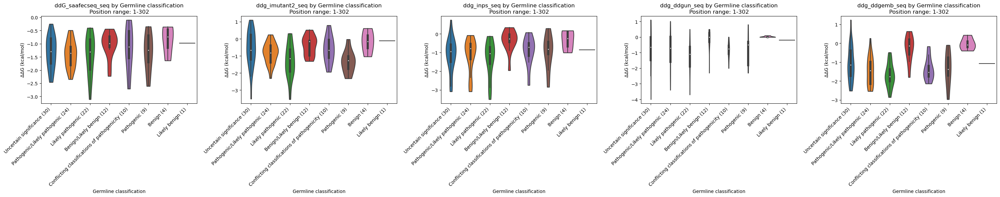

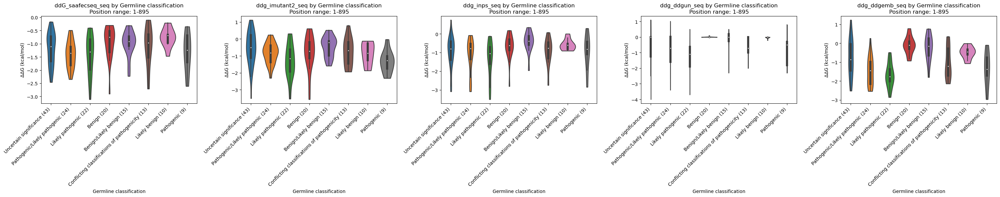

In [11]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re

file_path = "00_data/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq_af.xlsx"
df = pd.read_excel(file_path, sheet_name=0)

# Identify sequence-based ddg columns using regex (case-insensitive)
ddg_seq_cols = [col for col in df.columns if re.match(r'(?i)^ddg.*seq$', col)]

# Helper to filter, count, plot for a given range
def plot_range(df, pos_low, pos_high, range_name):
    df_range = df[(df['position'] >= pos_low) & (df['position'] <= pos_high)].copy()
    class_counts = df_range['Germline classification'].value_counts()
    order = class_counts.index.tolist()
    labels_with_counts = [f"{cls} ({class_counts[cls]})" for cls in order]
    label_map = dict(zip(order, labels_with_counts))
    df_range['Germline classification (count)'] = df_range['Germline classification'].map(label_map)
    
    plt.figure(figsize=(6 * len(ddg_seq_cols), 6))
    for i, col in enumerate(ddg_seq_cols, 1):
        plt.subplot(1, len(ddg_seq_cols), i)
        sns.violinplot(
            data=df_range,
            x='Germline classification (count)',
            y=col,
            order=labels_with_counts,
            inner='box',
            cut=0
        )
        plt.title(f'{col} by Germline classification\nPosition range: {range_name}')
        plt.xlabel('Germline classification')
        plt.ylabel('ΔΔG (kcal/mol)')
        plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

# Plot for 1-302
plot_range(df, 1, 302, "1-302")

# Plot for 1-895
plot_range(df, 1, 895, "1-895")
 



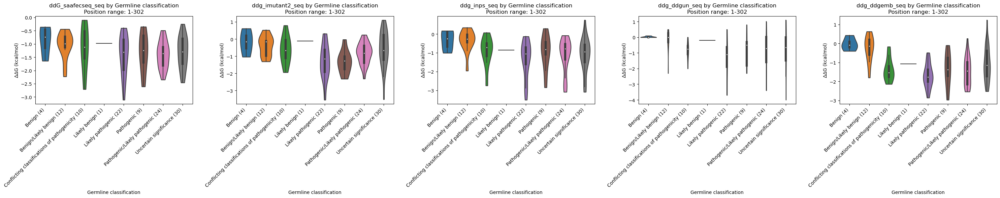

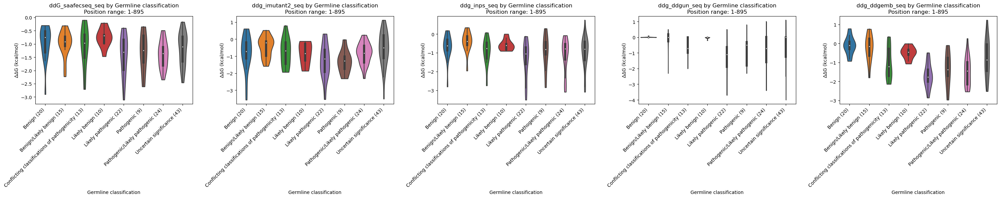

In [12]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re

file_path = "00_data/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq_af.xlsx"
df = pd.read_excel(file_path, sheet_name=0)

# Identify sequence-based ddg columns using regex (case-insensitive)
ddg_seq_cols = [col for col in df.columns if re.match(r'(?i)^ddg.*seq$', col)]

def plot_range(df, pos_low, pos_high, range_name):
    df_range = df[(df['position'] >= pos_low) & (df['position'] <= pos_high)].copy()
    # Get all unique classes in alphabetical order
    class_list = sorted(df_range['Germline classification'].dropna().unique())
    # Count for each class
    class_counts = df_range['Germline classification'].value_counts()
    labels_with_counts = [f"{cls} ({class_counts.get(cls, 0)})" for cls in class_list]
    label_map = dict(zip(class_list, labels_with_counts))
    df_range['Germline classification (count)'] = df_range['Germline classification'].map(label_map)

    plt.figure(figsize=(6 * len(ddg_seq_cols), 6))
    for i, col in enumerate(ddg_seq_cols, 1):
        plt.subplot(1, len(ddg_seq_cols), i)
        sns.violinplot(
            data=df_range,
            x='Germline classification (count)',
            y=col,
            order=labels_with_counts,
            inner='box',
            cut=0
        )
        plt.title(f'{col} by Germline classification\nPosition range: {range_name}')
        plt.xlabel('Germline classification')
        plt.ylabel('ΔΔG (kcal/mol)')
        plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

# Plot for 1-302
plot_range(df, 1, 302, "1-302")

# Plot for 1-895
plot_range(df, 1, 895, "1-895")


## 10.2 Final

In [21]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re
import os

file_path = "00_data/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq_af.xlsx"
output_dir = "02_folding/10_output/250522_seq_str"

os.makedirs(output_dir, exist_ok=True)

# Identify sequence-based ddg columns using regex (case-insensitive)
ddg_seq_cols = [col for col in df.columns if re.match(r'(?i)^ddg.*seq$', col)]

def plot_range_and_save(df, pos_low, pos_high, range_name, output_dir):
    df_range = df[(df['position'] >= pos_low) & (df['position'] <= pos_high)].copy()
    class_list = sorted(df_range['Germline classification'].dropna().unique())
    class_counts = df_range['Germline classification'].value_counts()
    labels_with_counts = [f"{cls} ({class_counts.get(cls, 0)})" for cls in class_list]
    label_map = dict(zip(class_list, labels_with_counts))
    df_range['Germline classification (count)'] = df_range['Germline classification'].map(label_map)

    fig = plt.figure(figsize=(6 * len(ddg_seq_cols), 6))
    for i, col in enumerate(ddg_seq_cols, 1):
        plt.subplot(1, len(ddg_seq_cols), i)
        sns.violinplot(
            data=df_range,
            x='Germline classification (count)',
            y=col,
            order=labels_with_counts,
            inner='box',
            cut=0
        )
        plt.title(f'{col} by Germline classification\nPosition range: {range_name}')
        plt.xlabel('Germline classification')
        plt.ylabel('ΔΔG (kcal/mol)')
        plt.xticks(rotation=45, ha='right')
    plt.tight_layout()

    # Save the figure
    pdf_path = os.path.join(output_dir, f"violinplot_ddg_seq_{range_name.replace('-', '_')}.pdf")
    png_path = os.path.join(output_dir, f"violinplot_ddg_seq_{range_name.replace('-', '_')}.png")
    fig.savefig(pdf_path, format='pdf', bbox_inches='tight')
    fig.savefig(png_path, format='png', dpi=400, bbox_inches='tight')
    plt.close(fig)
    print(f"Saved: {pdf_path}\nSaved: {png_path}")

# Load data
df = pd.read_excel(file_path, sheet_name=0)

# Plot and save for 1-302
plot_range_and_save(df, 1, 302, "1-302", output_dir)

# Plot and save for 1-895
plot_range_and_save(df, 1, 895, "1-895", output_dir)

Saved: 02_folding/10_output/250522_seq_str/violinplot_ddg_seq_1_302.pdf
Saved: 02_folding/10_output/250522_seq_str/violinplot_ddg_seq_1_302.png
Saved: 02_folding/10_output/250522_seq_str/violinplot_ddg_seq_1_895.pdf
Saved: 02_folding/10_output/250522_seq_str/violinplot_ddg_seq_1_895.png


In [14]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re
import os

file_path = "00_data/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq_af.xlsx"
output_dir = "02_folding/10_output/250522_seq_str"

os.makedirs(output_dir, exist_ok=True)

# Load data
df = pd.read_excel(file_path, sheet_name=0)

# Identify structure-based ddg columns using regex (case-insensitive)
ddg_str_cols = [col for col in df.columns if re.match(r'(?i)^ddg.*str$', col)]

def plot_ddg_str_1_302_alphabetical_save(df, output_dir):
    df_range = df[(df['position'] >= 1) & (df['position'] <= 302)].copy()
    class_list = sorted(df_range['Germline classification'].dropna().unique())
    class_counts = df_range['Germline classification'].value_counts()
    labels_with_counts = [f"{cls} ({class_counts.get(cls, 0)})" for cls in class_list]
    label_map = dict(zip(class_list, labels_with_counts))
    df_range['Germline classification (count)'] = df_range['Germline classification'].map(label_map)

    fig = plt.figure(figsize=(6 * len(ddg_str_cols), 6))
    for i, col in enumerate(ddg_str_cols, 1):
        plt.subplot(1, len(ddg_str_cols), i)
        sns.violinplot(
            data=df_range,
            x='Germline classification (count)',
            y=col,
            order=labels_with_counts,
            inner='box',
            cut=0
        )
        plt.title(f'{col} by Germline classification\nPosition range: 1-302')
        plt.xlabel('Germline classification')
        plt.ylabel('ΔΔG (kcal/mol)')
        plt.xticks(rotation=45, ha='right')
    plt.tight_layout()

    # Save the figure
    pdf_path = os.path.join(output_dir, "violinplot_ddg_str_1_302.pdf")
    png_path = os.path.join(output_dir, "violinplot_ddg_str_1_302.png")
    fig.savefig(pdf_path, format='pdf', bbox_inches='tight')
    fig.savefig(png_path, format='png', dpi=400, bbox_inches='tight')
    plt.close(fig)
    print(f"Saved: {pdf_path}\nSaved: {png_path}")

# Plot and save for ddg*str, 1-302
plot_ddg_str_1_302_alphabetical_save(df, output_dir)

Saved: 02_folding/10_output/250522_seq_str/violinplot_ddg_str_1_302.pdf
Saved: 02_folding/10_output/250522_seq_str/violinplot_ddg_str_1_302.png


## 10.3 max ddg of benign and pathogenic per method

In [16]:
import pandas as pd
import re
from IPython.display import display

file_path = '00_data/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq_af.xlsx'
sheet_name = 'Sheet1_with_AF'

# Load data
df = pd.read_excel(file_path, sheet_name=sheet_name)

# Filter for positions 1-302 and Benign/Pathogenic
df_sub = df[
    (df['position'] >= 1) &
    (df['position'] <= 302) &
    (df['Germline classification'].isin(['Benign', 'Pathogenic']))
].copy()

# Identify all ddg_*_str columns (methods)
ddg_str_cols = [col for col in df_sub.columns if re.match(r'^ddg_.*_str$', col)]

# Build the wide table
# Only keep relevant columns
cols_to_keep = ['Germline classification', 'mutation'] + ddg_str_cols
table = df_sub[cols_to_keep].copy()
# Rename columns as requested
table = table.rename(columns={'Germline classification': 'germline classification', 'Mutation': 'mutation'})

# Drop duplicates if there are multiple entries for the same mutation/class (keep the first occurrence)
table = table.drop_duplicates(subset=['germline classification', 'mutation'])

# Reset index for nice display
table = table.reset_index(drop=True)

display(table)

# Optionally, to save:
# table.to_excel('folding_mutation_ddgstr_wide_table_1_302.xlsx', index=False)
# table.to_csv('folding_mutation_ddgstr_wide_table_1_302.csv', index=False)

,germline classification,mutation,ddg_imutant2_str,ddg_inps_str,ddg_ddgun_str,ddg_mcsm_str,ddg_ddmut_str
0,Benign,I3F,-0.27,0.16,0.0,-0.675,0.04
1,Benign,N5D,-0.08,0.01,0.0,0.031,0.09
2,Pathogenic,G20R,-1.40,-0.63,-0.1,-0.649,-0.08
3,Pathogenic,G20V,-0.89,-0.69,0.1,-0.127,-0.39
4,Pathogenic,A40V,0.86,0.01,0.7,0.111,0.16
5,Pathogenic,I72T,-3.42,-2.88,-2.7,-3.195,-2.25
6,Pathogenic,H127R,-1.55,-0.26,-1.4,-1.597,-2.04
7,Pathogenic,D153G,-1.18,-0.83,-1.1,-0.769,-0.47
8,Pathogenic,W176C,-2.06,-1.48,-1.0,-1.211,-1.03
9,Pathogenic,R178W,-0.45,-0.48,0.9,-0.638,-0.12


# 250709: Analysis3

Figure size (inches): [12. 10.]
Base font size: 12.0


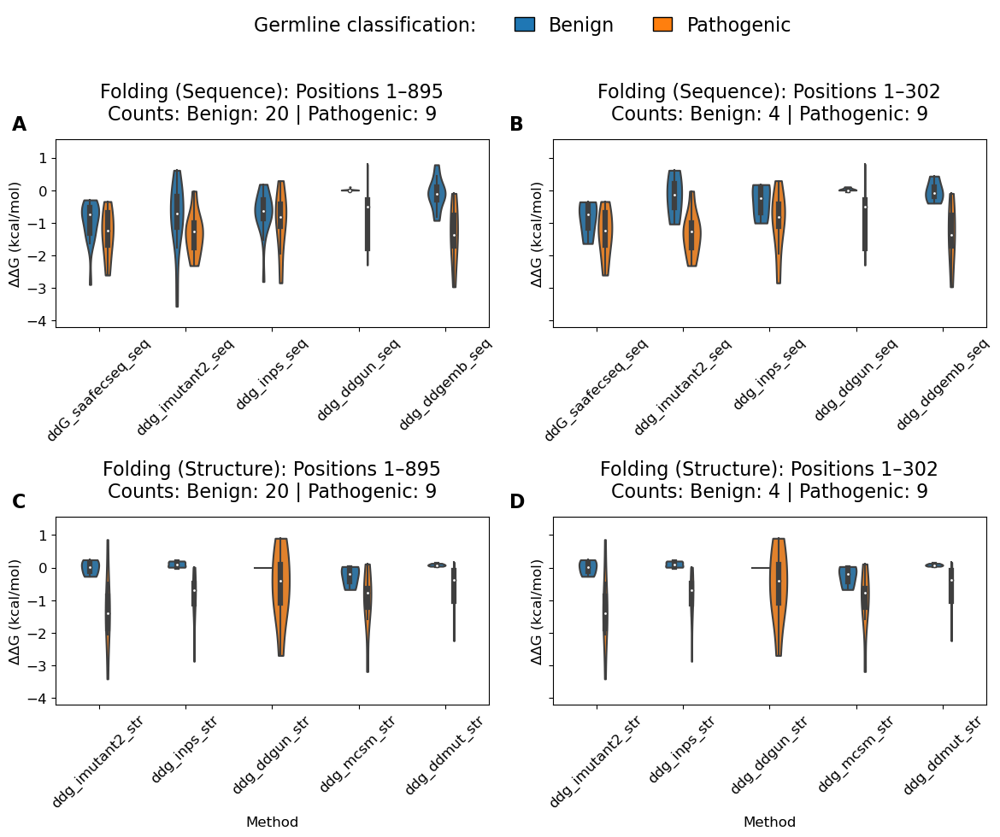

In [134]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re
import os
from matplotlib.patches import Patch

# ——— Configuration ———
file_path           = "00_data/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq_af.xlsx"
output_dir          = "02_folding/10_output/250522_seq_str"
fig_width           = 12
fig_height          = 10
font_size           = 12
panel_letter_size   = 16
title_fontsize      = 16
legend_fontsize     = 16   # default for Germline legend
hspace              = 0.6   # vertical space between rows
wspace              = 0.5   # horizontal space between columns
pad_inches          = 0.1
rect_params         = [0, 0.03, 1, 0.94]  # leave more room at top for legend

os.makedirs(output_dir, exist_ok=True)

# ——— Helper function ———
def add_germline_legend(fig, palette, fontsize, y=1.02):
    """
    Adds a single-line Germline classification legend to `fig`.
    `palette` is a dict mapping 'Benign'/'Pathogenic' to colors.
    `fontsize` controls legend text size.
    `y` is the vertical position (in figure coordinates).
    """
    header = Patch(facecolor='none', edgecolor='none',
                   label='Germline classification:')
    ben_handle  = Patch(facecolor=palette['Benign'], edgecolor='black',
                        label='Benign')
    path_handle = Patch(facecolor=palette['Pathogenic'], edgecolor='black',
                        label='Pathogenic')

    fig.legend(
        handles=[header, ben_handle, path_handle],
        labels=[h.get_label() for h in (header, ben_handle, path_handle)],
        loc='upper center',
        ncol=3,
        frameon=False,
        bbox_to_anchor=(0.5, y),
        fontsize=fontsize,
        handlelength=1
    )

# Load data
df = pd.read_excel(file_path, sheet_name=0)

# Identify sequence- and structure-based ΔΔG columns
ddg_seq_cols = [c for c in df.columns if re.match(r'(?i)^ddg.*seq$', c)]
ddg_str_cols = [c for c in df.columns if re.match(r'(?i)^ddg.*str$', c)]

# Compute global y-limits
all_vals = df[ddg_seq_cols + ddg_str_cols].to_numpy().flatten()
all_vals = all_vals[~pd.isna(all_vals)]
y_min, y_max = all_vals.min(), all_vals.max()

# Classes + palette
classes = ['Benign', 'Pathogenic']
palette = {'Benign': 'tab:blue', 'Pathogenic': 'tab:orange'}

# Apply base font size
plt.rcParams.update({'font.size': font_size})

# Create 2×2 grid
fig, axes = plt.subplots(2, 2,
                         figsize=(fig_width, fig_height),
                         sharey=True)
fig.subplots_adjust(hspace=hspace, wspace=wspace)

# Panel definitions
panels = [
    (axes[0,0], ddg_seq_cols, "Folding (Sequence): Positions 1–895", 1, 895, 'A'),
    (axes[0,1], ddg_seq_cols, "Folding (Sequence): Positions 1–302", 1, 302, 'B'),
    (axes[1,0], ddg_str_cols, "Folding (Structure): Positions 1–895", 1, 895, 'C'),
    (axes[1,1], ddg_str_cols, "Folding (Structure): Positions 1–302", 1, 302, 'D'),
]

for ax, cols, title, lo, hi, letter in panels:
    sub = df[df.position.between(lo, hi) &
             df['Germline classification'].isin(classes)]
    counts    = sub['Germline classification'].value_counts()
    count_str = " | ".join(f"{c}: {counts.get(c,0)}"
                           for c in classes)
    long = sub.melt(
        id_vars=['Germline classification'],
        value_vars=cols,
        var_name='Method',
        value_name='ΔΔG'
    )

    sns.violinplot(
        data=long, x='Method', y='ΔΔG',
        hue='Germline classification',
        palette=palette, inner='box',
        cut=0, width=0.4, dodge=True,
        ax=ax
    )

    # Subplot letter
    ax.text(-0.1, 1.05, letter,
            transform=ax.transAxes,
            fontsize=panel_letter_size,
            fontweight='bold')

    # Title and formatting
    ax.set_title(f"{title}\nCounts: {count_str}",
                 pad=16, fontsize=title_fontsize)
    ax.set_xlabel("")  # only bottom row will have labels
    ax.set_ylabel("ΔΔG (kcal/mol)")
    ax.tick_params(axis='x', rotation=45)
    ax.set_ylim(y_min, y_max)

    if ax.get_legend():
        ax.get_legend().remove()

# Bottom-row x-labels
for ax in axes[1, :]:
    ax.set_xlabel("Method")

# Add the Germline classification legend
add_germline_legend(fig, palette, legend_fontsize, y=1.02)

# Final layout and save
plt.tight_layout(rect=rect_params)
print(f"Figure size (inches): {fig.get_size_inches()}")
print(f"Base font size: {plt.rcParams['font.size']}")

out_path = os.path.join(output_dir,
                        "folding_sequence_structure_composite.png")
fig.savefig(out_path,
            dpi=300,
            bbox_inches='tight',
            pad_inches=pad_inches)
plt.show()

fig.savefig(
    out_path,
    dpi=300,
    bbox_inches='tight',
    pad_inches=pad_inches
)

plt.close(fig)


Figure size (inches): [12. 10.]
Base font size: 12.0


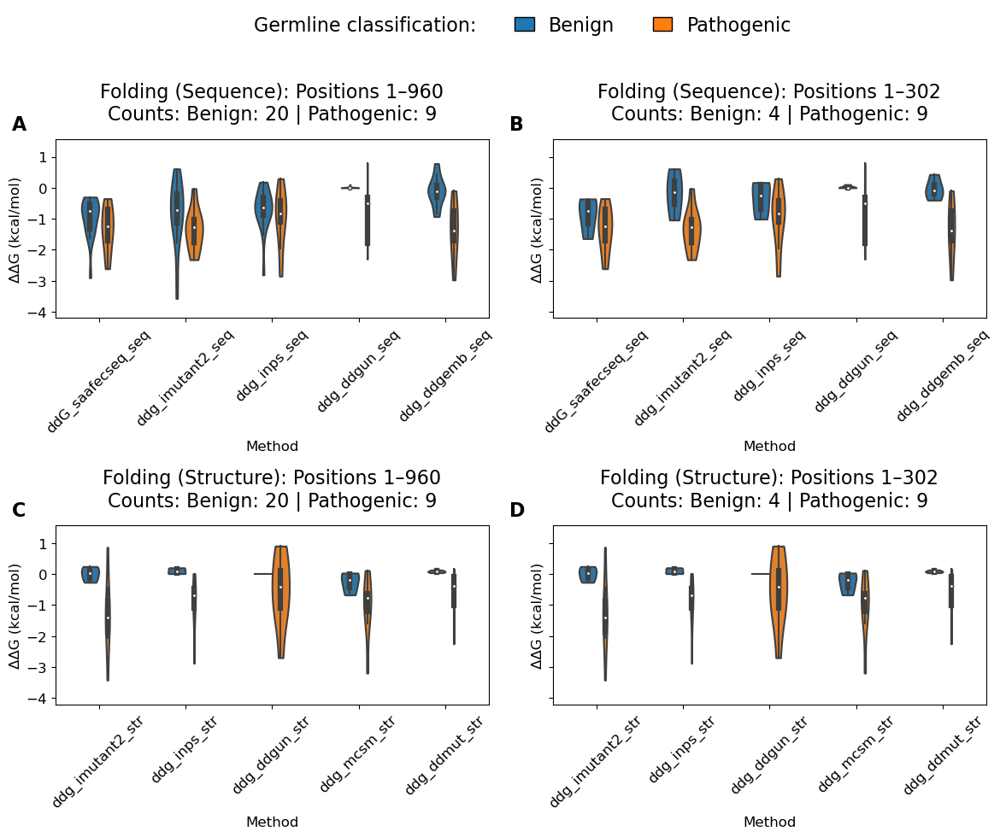

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import re
import os
from matplotlib.patches import Patch

# ——— Configuration ———
file_path           = "00_data/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq_af.xlsx"
output_dir          = "02_folding/10_output/250522_seq_str"
fig_width           = 12
fig_height          = 10
font_size           = 12
panel_letter_size   = 16
title_fontsize      = 16
legend_fontsize     = 16   # legend text size
hspace              = 0.6   # vertical space between rows
wspace              = 0.5   # horizontal space between columns
pad_inches          = 0.1
rect_params         = [0, 0.03, 1, 0.94]  # leave more room at top for legend

os.makedirs(output_dir, exist_ok=True)

# ——— Helper function ———
def add_germline_legend(fig, palette, fontsize, y=1.02):
    header = Patch(facecolor='none', edgecolor='none',
                   label='Germline classification:')
    ben_handle  = Patch(facecolor=palette['Benign'], edgecolor='black',
                        label='Benign')
    path_handle = Patch(facecolor=palette['Pathogenic'], edgecolor='black',
                        label='Pathogenic')

    fig.legend(
        handles=[header, ben_handle, path_handle],
        labels=[h.get_label() for h in (header, ben_handle, path_handle)],
        loc='upper center',
        ncol=3,
        frameon=False,
        bbox_to_anchor=(0.5, y),
        fontsize=fontsize,
        handlelength=1
    )

# Load data
df = pd.read_excel(file_path, sheet_name=0)

# Identify sequence- and structure-based ΔΔG columns
ddg_seq_cols = [c for c in df.columns if re.match(r'(?i)^ddg.*seq$', c)]
ddg_str_cols = [c for c in df.columns if re.match(r'(?i)^ddg.*str$', c)]

# Compute global y-limits
all_vals = df[ddg_seq_cols + ddg_str_cols].to_numpy().flatten()
all_vals = all_vals[~pd.isna(all_vals)]
y_min, y_max = all_vals.min(), all_vals.max()

# Classes + palette
classes = ['Benign', 'Pathogenic']
palette = {'Benign': 'tab:blue', 'Pathogenic': 'tab:orange'}

# Apply base font size
plt.rcParams.update({'font.size': font_size})

# Create 2×2 grid
fig, axes = plt.subplots(
    nrows=2, ncols=2,
    figsize=(fig_width, fig_height),
    sharey=True
)
fig.subplots_adjust(hspace=hspace, wspace=wspace)

# Panel definitions
panels = [
    (axes[0,0], ddg_seq_cols, "Folding (Sequence): Positions 1–960", 1, 895, 'A'),
    (axes[0,1], ddg_seq_cols, "Folding (Sequence): Positions 1–302", 1, 302, 'B'),
    (axes[1,0], ddg_str_cols, "Folding (Structure): Positions 1–960", 1, 895, 'C'),
    (axes[1,1], ddg_str_cols, "Folding (Structure): Positions 1–302", 1, 302, 'D'),
]

for ax, cols, title, lo, hi, letter in panels:
    sub = df[df.position.between(lo, hi) &
             df['Germline classification'].isin(classes)]
    counts    = sub['Germline classification'].value_counts()
    count_str = " | ".join(f"{c}: {counts.get(c,0)}"
                           for c in classes)
    long = sub.melt(
        id_vars=['Germline classification'],
        value_vars=cols,
        var_name='Method',
        value_name='ΔΔG'
    )
    sns.violinplot(
        data=long, x='Method', y='ΔΔG',
        hue='Germline classification',
        palette=palette, inner='box',
        cut=0, width=0.4, dodge=True,
        ax=ax
    )
    # Subplot letter
    ax.text(-0.1, 1.05, letter,
            transform=ax.transAxes,
            fontsize=panel_letter_size,
            fontweight='bold')
    # Title
    ax.set_title(f"{title}\nCounts: {count_str}",
                 pad=16, fontsize=title_fontsize)
    # X-label on every panel now
    ax.set_xlabel("Method", fontsize=font_size)
    ax.set_ylabel("ΔΔG (kcal/mol)")
    ax.tick_params(axis='x', rotation=45)
    ax.set_ylim(y_min, y_max)
    if ax.get_legend():
        ax.get_legend().remove()

# Add the Germline classification legend
add_germline_legend(fig, palette, legend_fontsize, y=1.02)

# Final layout and save
plt.tight_layout(rect=rect_params)
print(f"Figure size (inches): {fig.get_size_inches()}")
print(f"Base font size: {plt.rcParams['font.size']}")

out_path = os.path.join(output_dir,
                        "folding_sequence_structure_composite.png")
fig.savefig(out_path,
            dpi=300,
            bbox_inches='tight',
            pad_inches=pad_inches)
plt.show()
plt.close(fig)


In [9]:
import pandas as pd
import re
import os

# ——— Configuration ———
file_path   = "00_data/01_cdkl5_clinvar_gaf_1kgp_hctr_comb_unq_af.xlsx"
output_dir  = "02_folding/10_output/250522_seq_str"
excel_name  = "cdkl5_folding_ddg_summary_table.xlsx"
output_excel = os.path.join(output_dir, excel_name)

# Ensure output folder exists
os.makedirs(output_dir, exist_ok=True)

# ——— Load data ———
df = pd.read_excel(file_path)

# ——— Identify ΔΔG columns ———
ddg_seq_cols = [c for c in df.columns if re.match(r'(?i)^ddg.*seq$', c)]
ddg_str_cols = [c for c in df.columns if re.match(r'(?i)^ddg.*str$', c)]

# ——— Classes ———
classes = ['Benign', 'Pathogenic']

# ——— Summary-collection helper ———
def collect_ddg_summary(df, cols, region_lo, region_hi, region_label, method_type):
    rows = []
    sub = df[df.position.between(region_lo, region_hi) &
             df['Germline classification'].isin(classes)]
    for col in cols:
        for cls in classes:
            vals = sub.loc[sub['Germline classification'] == cls, col].dropna()
            if len(vals) == 0:
                continue
            rows.append({
                'Method':  col,
                'Type':    method_type,
                'Region':  region_label,
                'Class':   cls,
                'n':       len(vals),
                'Mean':    round(vals.mean(),  3),
                'Median':  round(vals.median(),3),
                'Std':     round(vals.std(),   3),
                'Min':     round(vals.min(),   3),
                'Max':     round(vals.max(),   3),
            })
    return rows

# ——— Gather all summaries ———
all_rows = []
all_rows += collect_ddg_summary(df, ddg_seq_cols, 1, 895, "Full",      "Sequence")
all_rows += collect_ddg_summary(df, ddg_seq_cols, 1, 302, "Kinase",    "Sequence")
all_rows += collect_ddg_summary(df, ddg_str_cols, 1, 895, "Full",      "Structure")
all_rows += collect_ddg_summary(df, ddg_str_cols, 1, 302, "Kinase",    "Structure")

# ——— Build DataFrame, save, and print ———
summary_df = pd.DataFrame(all_rows)

# Save alongside the figure
summary_df.to_excel(output_excel, index=False)
print(f"⮕ Saved summary table to {output_excel}\n")

# Print for manual copy-paste
print("===== CDKL5 ΔΔG Summary Table =====")
print(summary_df.to_string(index=False))


⮕ Saved summary table to 02_folding/10_output/250522_seq_str/cdkl5_folding_ddg_summary_table.xlsx

===== CDKL5 ΔΔG Summary Table =====
           Method      Type Region      Class  n   Mean  Median   Std    Min    Max
ddG_saafecseq_seq  Sequence   Full     Benign 20 -0.948  -0.755 0.618 -2.900 -0.300
ddG_saafecseq_seq  Sequence   Full Pathogenic  9 -1.341  -1.250 0.732 -2.610 -0.350
 ddg_imutant2_seq  Sequence   Full     Benign 20 -0.800  -0.720 1.022 -3.570  0.610
 ddg_imutant2_seq  Sequence   Full Pathogenic  9 -1.332  -1.280 0.672 -2.320 -0.030
     ddg_inps_seq  Sequence   Full     Benign 20 -0.672  -0.630 0.662 -2.810  0.180
     ddg_inps_seq  Sequence   Full Pathogenic  9 -0.978  -0.820 0.940 -2.850  0.290
    ddg_ddgun_seq  Sequence   Full     Benign 20  0.005   0.000 0.022  0.000  0.100
    ddg_ddgun_seq  Sequence   Full Pathogenic  9 -0.889  -0.500 1.075 -2.300  0.800
   ddg_ddgemb_seq  Sequence   Full     Benign 20 -0.114  -0.105 0.460 -0.930  0.780
   ddg_ddgemb_seq  Sequen